In [1]:
def merc_map(cbar_levels, X, Y, data, title, title_colorbar, cmap, path_save, title_save):
        '''
        Function for plotting a lambert projection map.
        
        Args : 
        cbar_levels, X, Y, data, title, title_colorbar, path_save, title_save
        '''
        import matplotlib.pyplot as plt
        import numpy as np
        from mpl_toolkits.basemap import Basemap
        
        v       = cbar_levels
        fig     = plt.figure(figsize=(12,12))
        m       = Basemap(projection='merc',llcrnrlat=-80,urcrnrlat=lat[-1],\
                  llcrnrlon=150.,urcrnrlon=270.,lat_ts=-60,resolution='c')
        #m       = Basemap(llcrnrlon=lon[0],llcrnrlat=-70.,urcrnrlon=lon[-1],urcrnrlat=lat[-1],\
        #          rsphere=(6378137.00,6356752.3142),\
        #          resolution='l',area_thresh=1000.,projection='lcc',\
        #          lat_1=-70.,lon_0=-185.)
        xm, ym  = m(X, Y)
        im      = m.contourf(xm, ym, data, levels=v, extend='both', cmap=cmap)

        cbar = m.colorbar(im,pad='10%')
        cbar.set_label(title_colorbar, fontsize =16)

        m.fillcontinents(color='0.5', lake_color='0.5')
        m.drawparallels(np.arange(-80.,-30.,10), labels=[1, 0, 0, 0])
        m.drawmeridians(np.arange(150.,270.,10), labels=[0, 0, 0, 1])
        m.drawcoastlines()



        plt.title(title, fontsize=18)
        plt.savefig(path_save + title_save, bbox_inches='tight')

In [2]:
def lambert_map(cbar_levels, X, Y, data, title, title_colorbar, cmap, path_save, title_save):
        '''
        Function for plotting a lambert projection map.
        
        Args : 
        cbar_levels, X, Y, data, title, title_colorbar, path_save, title_save
        '''
        import matplotlib.pyplot as plt
        import numpy as np
        from mpl_toolkits.basemap import Basemap
        
        v       = cbar_levels
        fig     = plt.figure(figsize=(8,8))
        m       = Basemap(llcrnrlon=162.,llcrnrlat=-79.,urcrnrlon=230.,urcrnrlat=-68.,\
                  rsphere=(6378137.00,6356752.3142),\
                  resolution='l',area_thresh=1000.,projection='lcc',\
                  lat_1=65.,lon_0=180.)
        xm, ym  = m(X, Y)
        im      = m.contourf(xm, ym, data, levels=v, extend='both', cmap=cmap)

        cbar = m.colorbar(im,pad='10%')
        cbar.set_label(title_colorbar, fontsize =16)

        m.fillcontinents(color='0.5', lake_color='0.5')
        m.drawparallels(np.arange(-80.,-60.,5), labels=[1, 0, 0, 0])
        m.drawmeridians(np.arange(160.,210.,5), labels=[0, 0, 0, 1])
        m.drawcoastlines()



        plt.title(title, fontsize=18)
        plt.savefig(path_save + title_save, bbox_inches='tight')

In [3]:
# Functions to save and load variables/data

def pickle_save(name, path, data, verbose=True):
    if not os.path.exists(path):
        os.makedirs(path)
    full_name = (os.path.join(path,name+ '.npy'))


    with open(full_name, 'wb') as f2:
        pickle.dump(data, f2)
    if verbose:
        print('saved at : ',full_name)

def pickle_load(name, path, verbose=True):
    #if not os.path.exists(path):
    #    os.makedirs(path)
    full_name= (os.path.join(path,name+ '.npy'))

    with open(full_name, 'r') as f:
        data=pickle.load(f)

    if verbose:
        print('loaded from : ',full_name)
    return data

In [4]:
def annual_mean(cbar_levels, field, depth, type_map, title, title_colorbar, cmap, path_save, title_save):
    
    T1   = file1.variables[field][:,depth,:200,:]
    T2   = file2.variables[field][:,depth,:200,:]
    T3   = file3.variables[field][:,depth,:200,:]
    T4   = file4.variables[field][:,depth,:200,:]
    T5   = file5.variables[field][:,depth,:200,:]
    T6   = file6.variables[field][:,depth,:200,:]
    T7   = file7.variables[field][:,depth,:200,:]
    T8   = file8.variables[field][:,depth,:200,:]
    T9   = file9.variables[field][:,depth,:200,:]
    T10 = file10.variables[field][:,depth,:200,:]
    T11 = file11.variables[field][:,depth,:200,:]
    T12 = file12.variables[field][:,depth,:200,:]
    
    T1 = np.squeeze(T1)
    T2 = np.squeeze(T2)
    T3 = np.squeeze(T3)
    T4 = np.squeeze(T4)
    T5 = np.squeeze(T5)
    T6 = np.squeeze(T6)
    T7 = np.squeeze(T7)
    T8 = np.squeeze(T8)
    T9 = np.squeeze(T9)
    T10 = np.squeeze(T10)
    T11 = np.squeeze(T11)
    T12 = np.squeeze(T12)
    
    T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12
    
    # Change lons from -180-180 to 0-360
    T_new = np.ma.masked_all((len(lat), len(lon)))
    
    for i in range(720):
        T_new[:,i]=T[:,i+720]
        
    for i in range(720):
        T_new[:,i+720]=T[:,i]
        
    print('Temperature min, max, mean :', T_new.min(), T_new.max(), np.mean(T_new))
    
    type_map(cbar_levels, LON_new, LAT, T_new, title, title_colorbar, cmap, path_save, title_save)

In [5]:
def seasonal_mean(ind, cbar_levels, field, depth, type_map, title, title_colorbar, cmap, path_save, title_save):
    
    if ind==1:
        T1   = file1.variables[field][:,depth,:200,:]
        T2   = file2.variables[field][:,depth,:200,:]
        T12 = file12.variables[field][:,depth,:200,:]
        
        T1 = np.squeeze(T1)
        T2 = np.squeeze(T2)
        T12 = np.squeeze(T12)
        
        T = (T1 + T2 + T12)/3
    else:
        T6   = file6.variables['temperature'][:,depth,:200,:]
        T7   = file7.variables['temperature'][:,depth,:200,:]
        T8   = file8.variables['temperature'][:,depth,:200,:]
        
        T6 = np.squeeze(T6)
        T7 = np.squeeze(T7)
        T8 = np.squeeze(T8)
        
        T = (T6 + T7 + T8)/3
            
    # Change lons from -180-180 to 0-360
    T_new = np.ma.masked_all((len(lat), len(lon)))
    
    for i in range(720):
        T_new[:,i]=T[:,i+720]
        
    for i in range(720):
        T_new[:,i+720]=T[:,i]    
        
    print('Temperature min, max, mean :', T_new.min(), T_new.max(), np.mean(T_new))

    type_map(cbar_levels, LON_new, LAT, T_new, title, title_colorbar, cmap, path_save, title_save)

In [6]:
def annual_diff(IND, cbar_levels, field, depth, mean_Field, title, title_colorbar, cmap, path_save, title_save):
    
    T1   = file1.variables[field][:,depth,:200,:]
    T2   = file2.variables[field][:,depth,:200,:]
    T3   = file3.variables[field][:,depth,:200,:]
    T4   = file4.variables[field][:,depth,:200,:]
    T5   = file5.variables[field][:,depth,:200,:]
    T6   = file6.variables[field][:,depth,:200,:]
    T7   = file7.variables[field][:,depth,:200,:]
    T8   = file8.variables[field][:,depth,:200,:]
    T9   = file9.variables[field][:,depth,:200,:]
    T10 = file10.variables[field][:,depth,:200,:]
    T11 = file11.variables[field][:,depth,:200,:]
    T12 = file12.variables[field][:,depth,:200,:]
    
    T1 = np.squeeze(T1)
    T2 = np.squeeze(T2)
    T3 = np.squeeze(T3)
    T4 = np.squeeze(T4)
    T5 = np.squeeze(T5)
    T6 = np.squeeze(T6)
    T7 = np.squeeze(T7)
    T8 = np.squeeze(T8)
    T9 = np.squeeze(T9)
    T10 = np.squeeze(T10)
    T11 = np.squeeze(T11)
    T12 = np.squeeze(T12)
    
    T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12
    
    # Change lons from -180-180 to 0-360
    T_new = np.ma.masked_all((len(lat), len(lon)))
    
    for i in range(720):
        T_new[:,i]=T[:,i+720]
        
    for i in range(720):
        T_new[:,i+720]=T[:,i]    
    
    mean_Field = pickle_load(mean_Field, '/data/ebent')
    nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')
    
    if IND==1:
        lon_min = 1800
        lon_max = 3240
        lat_min = 0
        lat_max = 1170
    else:
        lon_min = 1950
        lon_max = 2520
        lat_min = 0
        lat_max = 541
        
    y = nc.variables['lat'][lat_min:lat_max]
    x = nc.variables['lon'][lon_min:lon_max]
    mean_Field = interpolate.interp2d(x, y, mean_Field, kind='linear')(lon_new, lat)
    
    Diff = T_new-mean_Field
    print('Diff min, max, mean :', Diff.min(), Diff.max(), np.mean(Diff))
    
    if IND==1:
        merc_map(cbar_levels, LON_new, LAT, Diff, title, title_colorbar, cmap, path_save, title_save)
        
    else:
        lambert_map(cbar_levels, LON_new, LAT, Diff, title, title_colorbar, cmap, path_save, title_save)

In [7]:
def seasonal_diff(ind, IND, cbar_levels, field, depth, mean_Field, title, title_colorbar, cmap, path_save, title_save):
    
    if ind==1:
        T1   = file1.variables[field][:,depth,:200,:]
        T2   = file2.variables[field][:,depth,:200,:]
        T12 = file12.variables[field][:,depth,:200,:]
        
        T1 = np.squeeze(T1)
        T2 = np.squeeze(T2)
        T12 = np.squeeze(T12)
        
        T = (T1 + T2 + T12)/3
    else:
        T6   = file6.variables['temperature'][:,depth,:200,:]
        T7   = file7.variables['temperature'][:,depth,:200,:]
        T8   = file8.variables['temperature'][:,depth,:200,:]
        
        T6 = np.squeeze(T6)
        T7 = np.squeeze(T7)
        T8 = np.squeeze(T8)
        
        T = (T6 + T7 + T8)/3
            
    # Change lons from -180-180 to 0-360
    T_new = np.ma.masked_all((len(lat), len(lon)))
    
    for i in range(720):
        T_new[:,i]=T[:,i+720]
        
    for i in range(720):
        T_new[:,i+720]=T[:,i]    
    
    mean_Field = pickle_load(mean_Field, '/data/ebent')
    nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')
    
    if IND==1:
        lon_min = 1800
        lon_max = 3240
        lat_min = 0
        lat_max = 1170
    else:
        lon_min = 1950
        lon_max = 2520
        lat_min = 0
        lat_max = 541
        
    y = nc.variables['lat'][lat_min:lat_max]
    x = nc.variables['lon'][lon_min:lon_max]
    mean_Field = interpolate.interp2d(x, y, mean_Field, kind='linear')(lon_new, lat)
    
    Diff = T_new-mean_Field
    print('Diff min, max, mean :', Diff.min(), Diff.max(), np.mean(Diff))
    
    if IND==1:
        merc_map(cbar_levels, LON_new, LAT, Diff, title, title_colorbar, cmap, path_save, title_save)
        
    else:
        lambert_map(cbar_levels, LON_new, LAT, Diff, title, title_colorbar, cmap, path_save, title_save)

In [8]:
%matplotlib inline

import matplotlib.pyplot as plt
import numpy as np
from numpy import cos, pi
import h5py
from scipy.io import loadmat
from mpl_toolkits.basemap import Basemap
from netCDF4 import Dataset
from scipy import interpolate
import os
import pickle

load_path = '/project_shared/WAGHC/'
load_path2='/data/SO12/runs/RUN_BLING_Dec2017/SO12_RUN/DIAGNOSTICS/'
plot_path = '/home/ebent/plots/climatology'

***

# Read files and variables

In [9]:
file1 = Dataset(load_path+'WAGHC_PYC_01_UHAM-ICDC_v1_0.nc', 'r')
file2 = Dataset(load_path+'WAGHC_PYC_02_UHAM-ICDC_v1_0.nc', 'r')
file3 = Dataset(load_path+'WAGHC_PYC_03_UHAM-ICDC_v1_0.nc', 'r')
file4 = Dataset(load_path+'WAGHC_PYC_04_UHAM-ICDC_v1_0.nc', 'r')
file5 = Dataset(load_path+'WAGHC_PYC_05_UHAM-ICDC_v1_0.nc', 'r')
file6 = Dataset(load_path+'WAGHC_PYC_06_UHAM-ICDC_v1_0.nc', 'r')
file7 = Dataset(load_path+'WAGHC_PYC_07_UHAM-ICDC_v1_0.nc', 'r')
file8 = Dataset(load_path+'WAGHC_PYC_08_UHAM-ICDC_v1_0.nc', 'r')
file9 = Dataset(load_path+'WAGHC_PYC_09_UHAM-ICDC_v1_0.nc', 'r')
file10 = Dataset(load_path+'WAGHC_PYC_10_UHAM-ICDC_v1_0.nc', 'r')
file11 = Dataset(load_path+'WAGHC_PYC_11_UHAM-ICDC_v1_0.nc', 'r')
file12 = Dataset(load_path+'WAGHC_PYC_12_UHAM-ICDC_v1_0.nc', 'r')

In [10]:
lon = file1.variables['longitude'][:]
lat = file1.variables['latitude'][:200]
depth = file1.variables['depth'][:]
Lat, Depth = np.meshgrid(lat, depth)

In [11]:
lon_new = np.zeros((len(lon)))

for i in range(len(lon)):
    lon_new[i]=lon[i]+180

LON_new, LAT = np.meshgrid(lon_new, lat)

In [12]:
lon[120], lon[0]

(-150.0, -180.0)

# Temperature at 150W

In [15]:
file1.variables['temperature'].dimensions

(u'time', u'depth', u'latitude', u'longitude')

In [20]:
T1   = file1.variables['temperature'][:,:,:200,120]
T2   = file2.variables['temperature'][:,:,:200,120]
T3   = file3.variables['temperature'][:,:,:200,120]
T4   = file4.variables['temperature'][:,:,:200,120]
T5   = file5.variables['temperature'][:,:,:200,120]
T6   = file6.variables['temperature'][:,:,:200,120]
T7   = file7.variables['temperature'][:,:,:200,120]
T8   = file8.variables['temperature'][:,:,:200,120]
T9   = file9.variables['temperature'][:,:,:200,120]
T10 = file10.variables['temperature'][:,:,:200,120]
T11 = file11.variables['temperature'][:,:,:200,120]
T12 = file12.variables['temperature'][:,:,:200,120]

T1 = np.squeeze(T1)
T2 = np.squeeze(T2)
T3 = np.squeeze(T3)
T4 = np.squeeze(T4)
T5 = np.squeeze(T5)
T6 = np.squeeze(T6)
T7 = np.squeeze(T7)
T8 = np.squeeze(T8)
T9 = np.squeeze(T9)
T10 = np.squeeze(T10)
T11 = np.squeeze(T11)
T12 = np.squeeze(T12)

In [21]:
T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12

In [17]:
print(Depth.shape, Lat.shape, T.shape)

((65, 200), (65, 200), (65, 200))


In [15]:
print(T.max(), T.min())

(20.8099, -1.90455)


In [16]:
mean_Theta_150W = pickle_load('mean_Theta_150W', '/data/ebent')
nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')
print(mean_Theta_150W.max(), mean_Theta_150W.min())

('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
(21.196126446313976, -1.836644792390544)


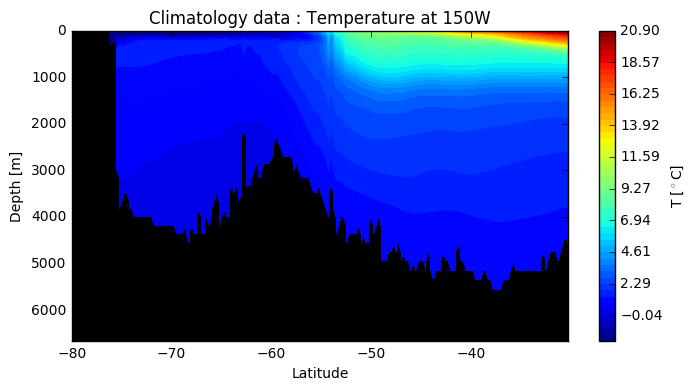

In [19]:
fig = plt.figure(figsize=(8,4), dpi=300)
fig.add_subplot(111,axisbg='k')

plt.contourf(Lat, Depth, T, cmap='jet', levels=np.linspace(-1.9,20.9,50)) #_r to invert it
plt.title('Climatology data : Temperature at 150W')
plt.xlabel('Latitude')
plt.ylabel('Depth [m]')

cb = plt.colorbar()
cb.set_label('T [$^\circ$C]')

plt.gca().invert_yaxis() #gca : get current axis
#plt.gca().invert_xaxis() 
plt.savefig(plot_path + 'T_150.png', bbox_inches='tight')

# Temperature at 180W

In [15]:
print(lon[0])

-180.0


In [27]:
T1 = file1.variables['temperature'][:,:,:200,0]
T2 = file2.variables['temperature'][:,:,:200,0]
T3 = file3.variables['temperature'][:,:,:200,0]
T4 = file4.variables['temperature'][:,:,:200,0]
T5 = file5.variables['temperature'][:,:,:200,0]
T6 = file6.variables['temperature'][:,:,:200,0]
T7 = file7.variables['temperature'][:,:,:200,0]
T8 = file8.variables['temperature'][:,:,:200,0]
T9 = file9.variables['temperature'][:,:,:200,0]
T10 = file10.variables['temperature'][:,:,:200,0]
T11 = file11.variables['temperature'][:,:,:200,0]
T12 = file12.variables['temperature'][:,:,:200,0]

T1 = np.squeeze(T1)
T2 = np.squeeze(T2)
T3 = np.squeeze(T3)
T4 = np.squeeze(T4)
T5 = np.squeeze(T5)
T6 = np.squeeze(T6)
T7 = np.squeeze(T7)
T8 = np.squeeze(T8)
T9 = np.squeeze(T9)
T10 = np.squeeze(T10)
T11 = np.squeeze(T11)
T12 = np.squeeze(T12)

In [28]:
T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12

In [24]:
print(Depth.shape, Lat.shape, T.shape)

((65, 200), (65, 200), (65, 200))


In [25]:
print(T.min(), T.max(), np.mean(T))

(-1.7623082, 20.879692, 4.6743548512089275)


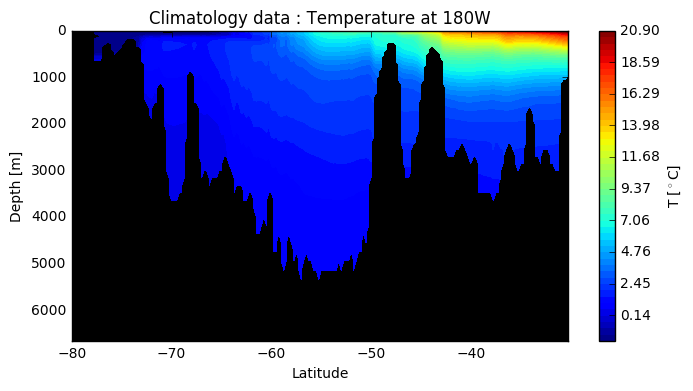

In [24]:
fig = plt.figure(figsize=(8,4), dpi=300)
fig.add_subplot(111,axisbg='k')

plt.contourf(Lat, Depth, T, cmap='jet', levels=np.linspace(-1.7,20.9,50)) #_r to invert it
plt.title('Climatology data : Temperature at 180W')
plt.xlabel('Latitude')
plt.ylabel('Depth [m]')

cb = plt.colorbar()
cb.set_label('T [$^\circ$C]')

plt.gca().invert_yaxis() #gca : get current axis
#plt.gca().invert_xaxis() 
plt.savefig(plot_path + 'T_180.png', bbox_inches='tight')

# Differences

# 150W

In [25]:
mean_Theta_150W = pickle_load('mean_Theta_150W', '/data/ebent')
nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')

# Mercator boxe
LAT = nc.variables['lat'][0:1170]
DEPTH = nc.variables['depth'][:]    

mean_Theta_150W = interpolate.interp2d(LAT, DEPTH, mean_Theta_150W, kind='linear')(lat, depth)

Diff = T-mean_Theta_150W
print('Diff min, max, mean :', Diff.min(), Diff.max(), np.mean(Diff))


('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('Diff min, max, mean :', -3.135575809459045, 1.516182542220875, 0.024247144524408317)


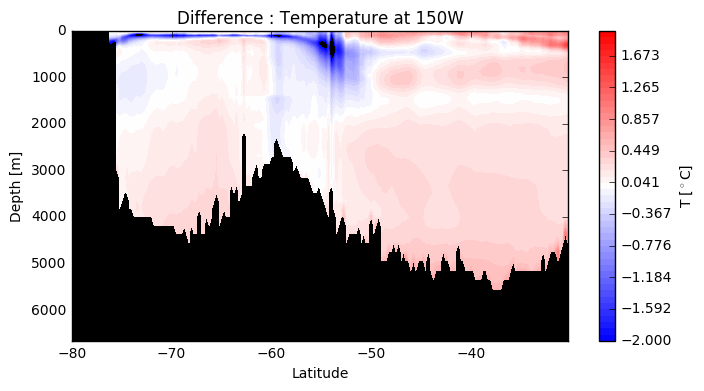

In [26]:
fig = plt.figure(figsize=(8,4), dpi=300)
fig.add_subplot(111,axisbg='k')

plt.contourf(Lat, Depth, Diff, cmap='bwr', levels=np.linspace(-2,2,50)) #_r to invert it
plt.title('Difference : Temperature at 150W')
plt.xlabel('Latitude')
plt.ylabel('Depth [m]')

cb = plt.colorbar()
cb.set_label('T [$^\circ$C]')

plt.gca().invert_yaxis() #gca : get current axis
#plt.gca().invert_xaxis() 
plt.savefig(plot_path + 'Diff_T_150.png', bbox_inches='tight')

In [22]:
mean_Theta_150W = pickle_load('mean_Theta_150W', '/data/ebent')
nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')

# Mercator boxe
LAT = nc.variables['lat'][0:1170]
DEPTH = nc.variables['depth'][:]   

minimum = T.min()
T_new = interpolate.interp2d(lat, depth, T, kind='linear')(LAT, DEPTH)
T_new = np.ma.masked_where(T_new<minimum, T_new)

Diff = T_new-mean_Theta_150W
print('Diff min, max, mean :', Diff.min(), Diff.max(), np.mean(Diff))

('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('Diff min, max, mean :', -3.341697150251946, 1.5197547379550738, -0.15100131006518783)


/usr/local/anaconda2/lib/python2.7/site-packages/numpy/ma/core.py:6442: MaskedArrayFutureWarning: In the future the default for ma.maximum.reduce will be axis=0, not the current None, to match np.maximum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)
/usr/local/anaconda2/lib/python2.7/site-packages/numpy/ma/core.py:6442: MaskedArrayFutureWarning: In the future the default for ma.minimum.reduce will be axis=0, not the current None, to match np.minimum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)


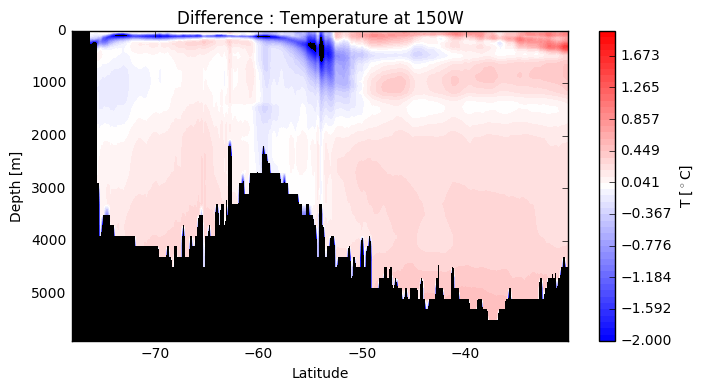

In [24]:
fig = plt.figure(figsize=(8,4), dpi=300)
fig.add_subplot(111,axisbg='k')

plt.contourf(LAT, DEPTH, Diff, cmap='bwr', levels=np.linspace(-2,2,50)) #_r to invert it
plt.title('Difference : Temperature at 150W')
plt.xlabel('Latitude')
plt.ylabel('Depth [m]')

cb = plt.colorbar()
cb.set_label('T [$^\circ$C]')

plt.gca().invert_yaxis() #gca : get current axis
#plt.gca().invert_xaxis() 
plt.savefig(plot_path + 'Diff_T_150.png', bbox_inches='tight')

# 180W

In [26]:
mean_Theta_180W = pickle_load('mean_Theta_180W', '/data/ebent')
nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')

# Mercator boxe
LAT = nc.variables['lat'][0:1170]
DEPTH = nc.variables['depth'][:]    

mean_Theta_180W = interpolate.interp2d(LAT, DEPTH, mean_Theta_180W, kind='linear')(lat, depth)

Diff = T-mean_Theta_180W
print('Diff min, max, mean :', Diff.min(), Diff.max(), np.mean(Diff))


('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('Diff min, max, mean :', -2.1309870897733223, 5.712249755859375, 0.07090073495544866)


In [15]:
print(T.max(), T.min())

(20.8099, -1.90455)


In [19]:
print(T_new.max(), T_new.min())

(20.80911521911621, -1.904367856973085)


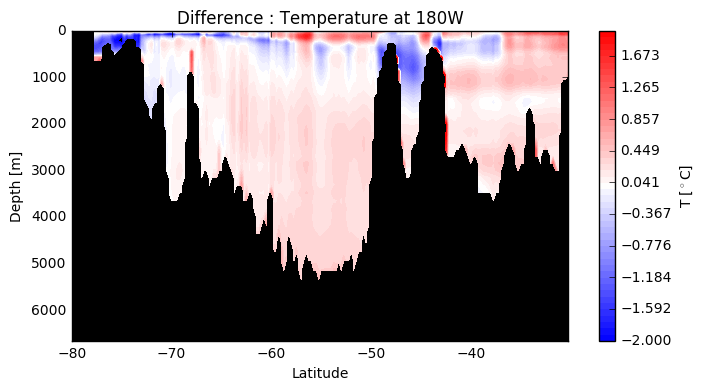

In [27]:
fig = plt.figure(figsize=(8,4), dpi=300)
fig.add_subplot(111,axisbg='k')

plt.contourf(Lat, Depth, Diff, cmap='bwr', levels=np.linspace(-2,2,50)) #_r to invert it
plt.title('Difference : Temperature at 180W')
plt.xlabel('Latitude')
plt.ylabel('Depth [m]')

cb = plt.colorbar()
cb.set_label('T [$^\circ$C]')

plt.gca().invert_yaxis() #gca : get current axis
#plt.gca().invert_xaxis() 
plt.savefig(plot_path + 'Diff_T_180.png', bbox_inches='tight')

In [29]:
mean_Theta_180W = pickle_load('mean_Theta_180W', '/data/ebent')
nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')

# Mercator boxe
LAT = nc.variables['lat'][0:1170]
DEPTH = nc.variables['depth'][:]    

minimum = T.min()
T_new = interpolate.interp2d(lat, depth, T, kind='linear')(LAT, DEPTH)
T_new = np.ma.masked_where(T_new<minimum, T_new)

Diff = T_new-mean_Theta_180W
print('Diff min, max, mean :', Diff.min(), Diff.max(), np.mean(Diff))


('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('Diff min, max, mean :', -9.995075786620193, 1.818941390097533, -0.11736041348031065)


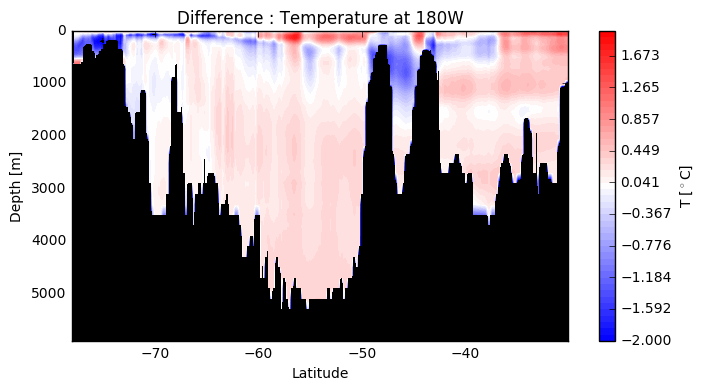

In [30]:
fig = plt.figure(figsize=(8,4), dpi=300)
fig.add_subplot(111,axisbg='k')

plt.contourf(LAT, DEPTH, Diff, cmap='bwr', levels=np.linspace(-2,2,50)) #_r to invert it
plt.title('Difference : Temperature at 180W')
plt.xlabel('Latitude')
plt.ylabel('Depth [m]')

cb = plt.colorbar()
cb.set_label('T [$^\circ$C]')

plt.gca().invert_yaxis() #gca : get current axis
#plt.gca().invert_xaxis() 
plt.savefig(plot_path + 'Diff_T_180.png', bbox_inches='tight')

***

# Lat/Lon sections

## Mercator

('Temperature min, max, mean :', -1.8244251012802124, 24.553390502929688, 7.2039502367594626)


/usr/local/anaconda2/lib/python2.7/site-packages/numpy/ma/core.py:6442: MaskedArrayFutureWarning: In the future the default for ma.maximum.reduce will be axis=0, not the current None, to match np.maximum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)
/usr/local/anaconda2/lib/python2.7/site-packages/numpy/ma/core.py:6442: MaskedArrayFutureWarning: In the future the default for ma.minimum.reduce will be axis=0, not the current None, to match np.minimum.reduce. Explicitly pass 0 or None to silence this warning.
  return self.reduce(a)


('Temperature min, max, mean :', -1.8457751274108887, 24.239290237426758, 7.055086128291223)
('Temperature min, max, mean :', -1.9476250410079956, 21.24574851989746, 6.069480657418829)
('Temperature min, max, mean :', -2.05049991607666, 18.792699813842773, 5.741758985994934)
('Temperature min, max, mean :', -1.7827831506729126, 13.894824981689453, 4.625205735689403)


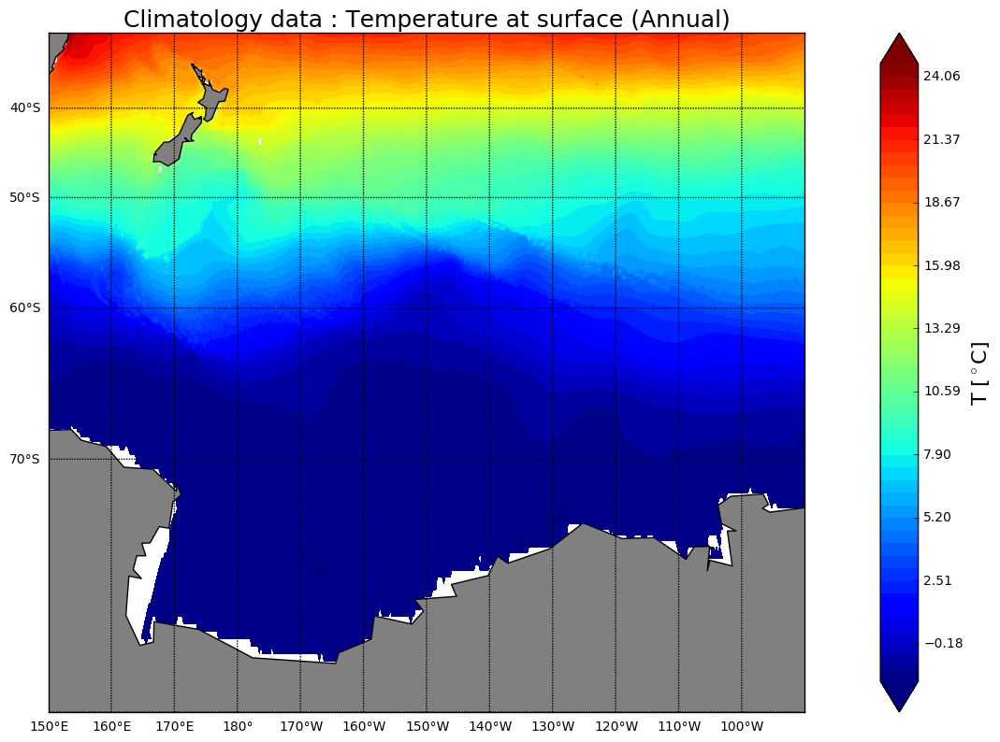

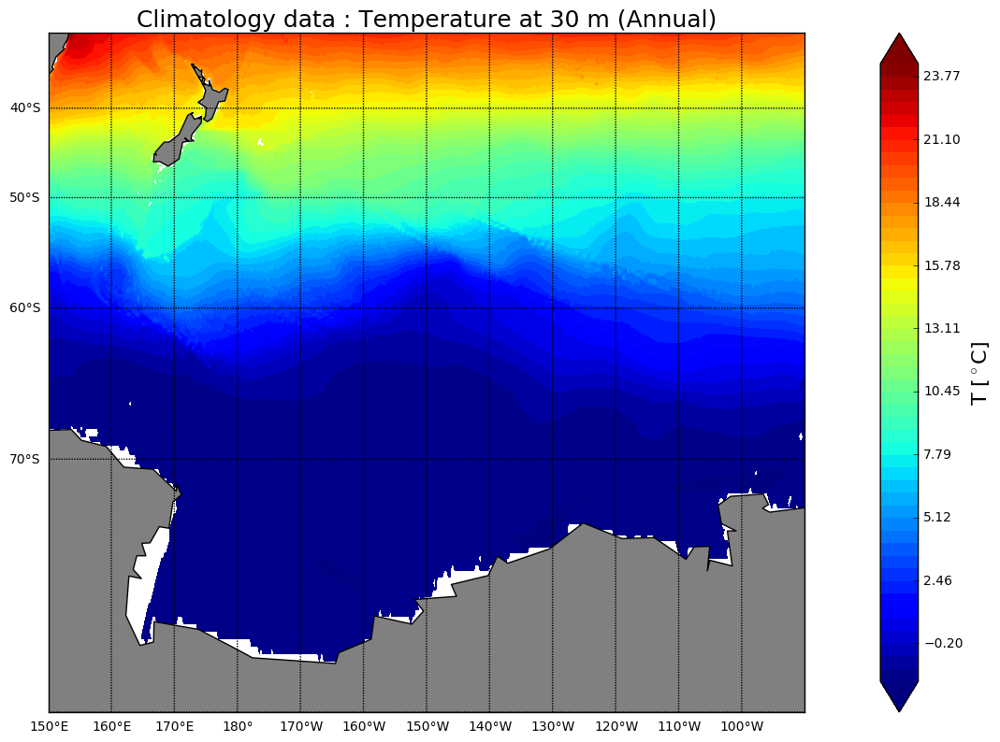

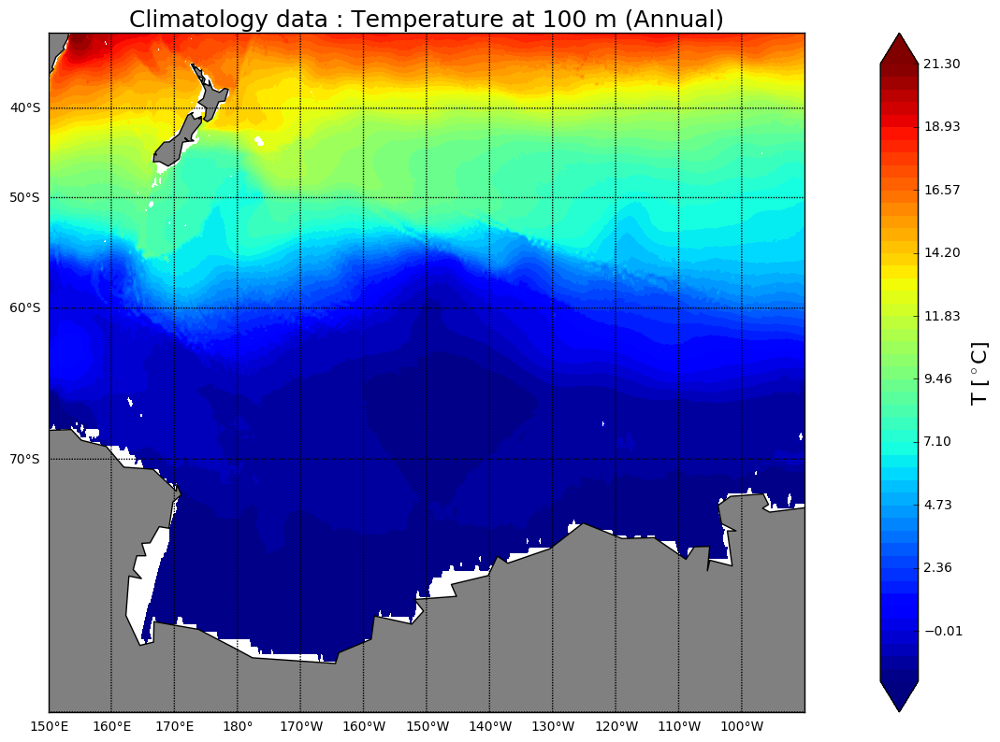

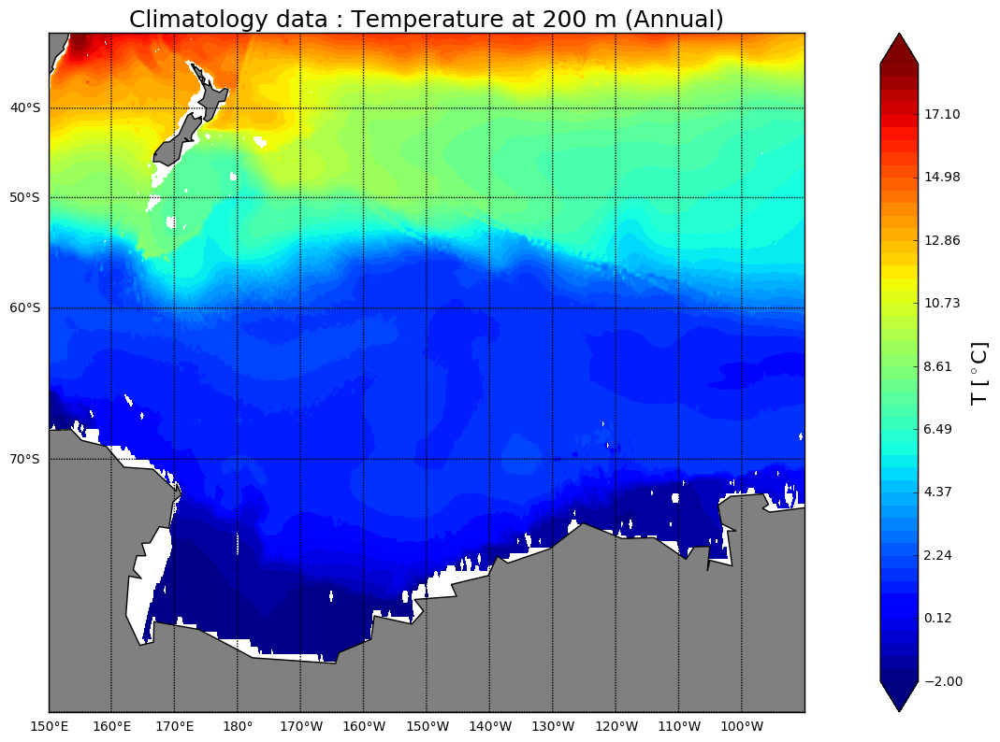

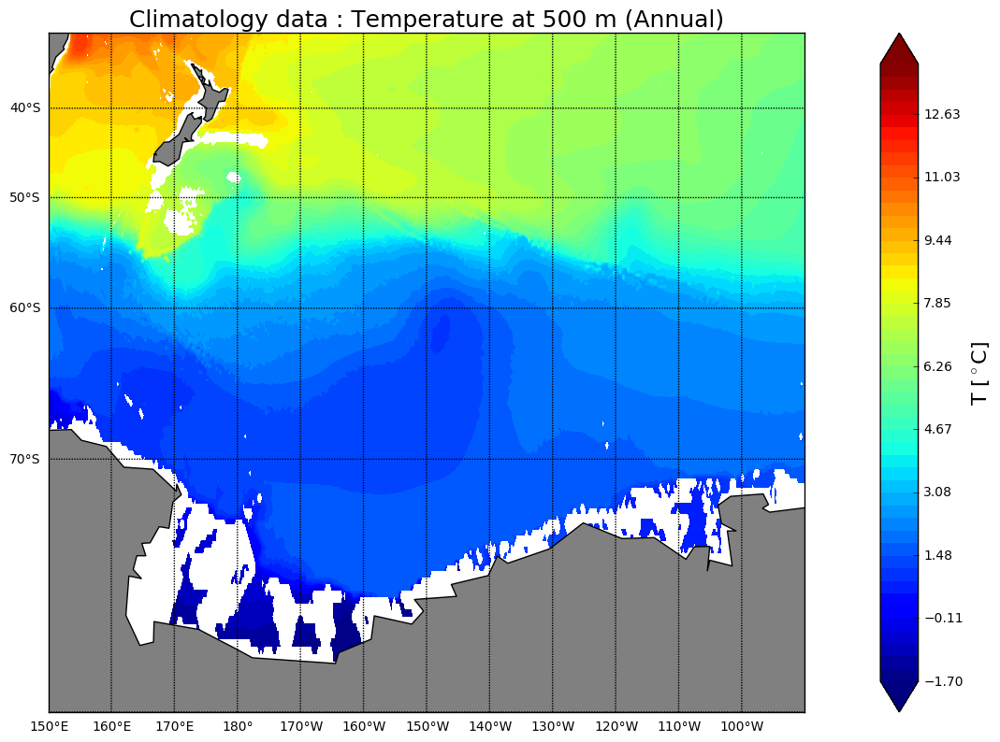

In [14]:
annual_mean(np.linspace(-1.8,24.6,50), 'temperature', 0,  merc_map, 'Climatology data : Temperature at surface (Annual)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Annual_merc_T_surf.png')
annual_mean(np.linspace(-1.8,24.3,50), 'temperature', 6,  merc_map, 'Climatology data : Temperature at 30 m (Annual)', 'T [$^\circ$C]',     plt.cm.jet, plot_path,    'Annual_merc_T_30.png')
annual_mean(np.linspace(-1.9,21.3,50), 'temperature', 12, merc_map, 'Climatology data : Temperature at 100 m (Annual)', 'T [$^\circ$C]',    plt.cm.jet, plot_path,   'Annual_merc_T_100.png')
annual_mean(np.linspace(-2.0,18.8,50), 'temperature', 16, merc_map, 'Climatology data : Temperature at 200 m (Annual)', 'T [$^\circ$C]',   plt.cm.jet, plot_path,   'Annual_merc_T_200.png')
annual_mean(np.linspace(-1.7,13.9,50), 'temperature', 22, merc_map, 'Climatology data : Temperature at 500 m (Annual)', 'T [$^\circ$C]',   plt.cm.jet, plot_path,   'Annual_merc_T_500.png')

## Lambert

('Temperature min, max, mean :', -1.8244251012802124, 24.553390502929688, 7.2039502367594626)
('Temperature min, max, mean :', -1.8457751274108887, 24.239290237426758, 7.055086128291223)
('Temperature min, max, mean :', -1.9476250410079956, 21.24574851989746, 6.069480657418829)
('Temperature min, max, mean :', -2.05049991607666, 18.792699813842773, 5.741758985994934)
('Temperature min, max, mean :', -1.7827831506729126, 13.894824981689453, 4.625205735689403)


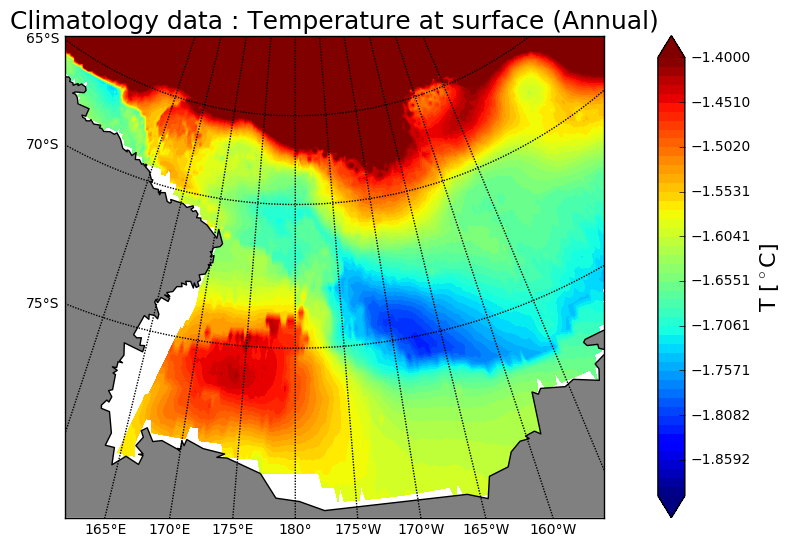

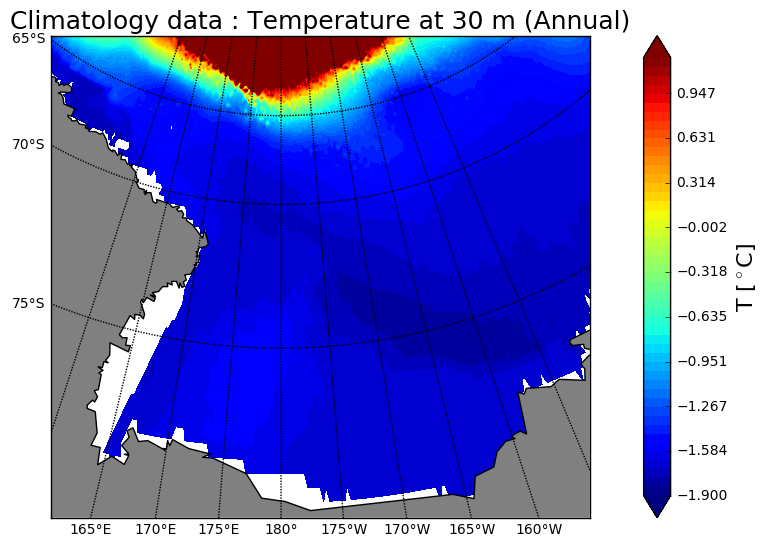

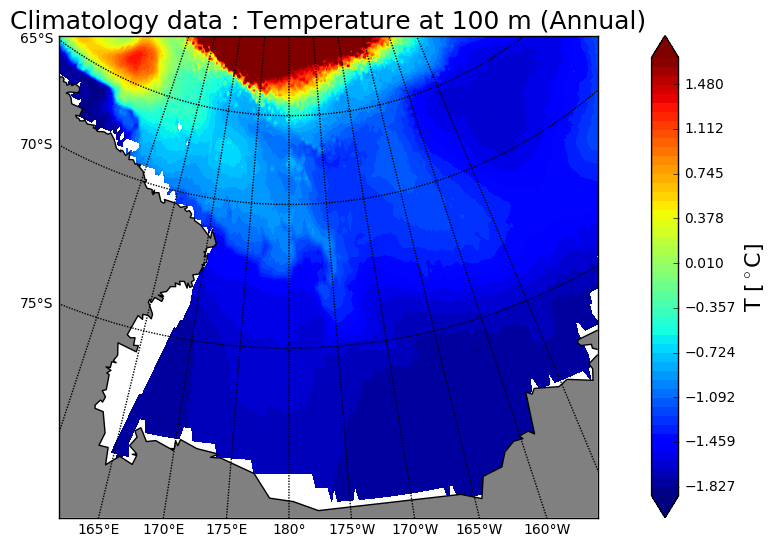

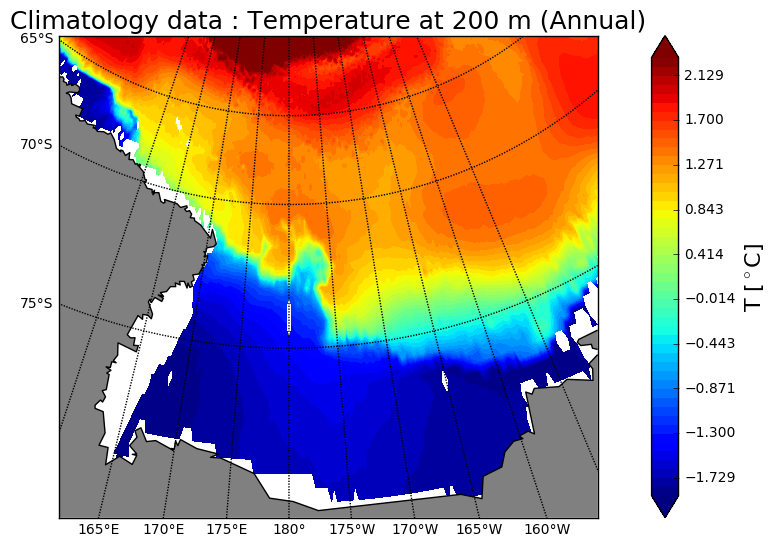

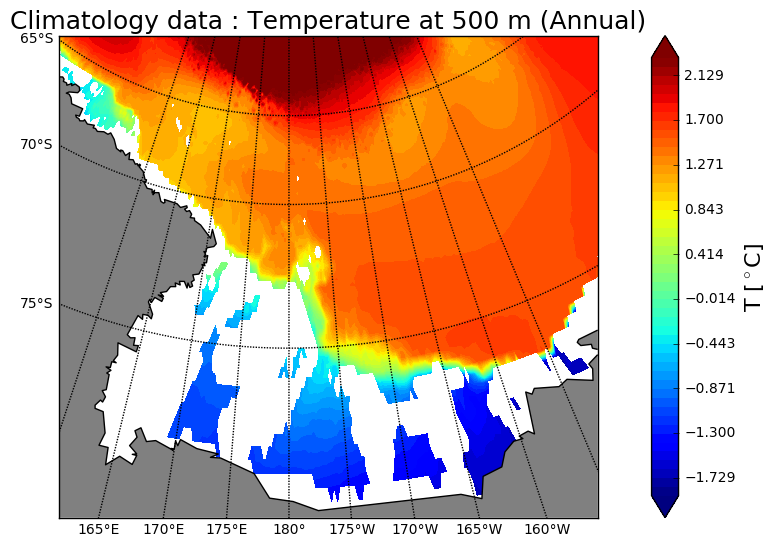

In [15]:
annual_mean(np.linspace(-1.9,-1.4,50), 'temperature', 0, lambert_map, 'Climatology data : Temperature at surface (Annual)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Annual_lamb_T_surf.png')
annual_mean(np.linspace(-1.9,1.2,50), 'temperature', 6,  lambert_map, 'Climatology data : Temperature at 30 m (Annual)', 'T [$^\circ$C]',     plt.cm.jet, plot_path,'Annual_lamb_T_30.png')
annual_mean(np.linspace(-1.9,1.7,50), 'temperature', 12, lambert_map, 'Climatology data : Temperature at 100 m (Annual)', 'T [$^\circ$C]',    plt.cm.jet, plot_path,'Annual_lamb_T_100.png')
annual_mean(np.linspace(-1.9,2.3,50), 'temperature', 16, lambert_map, 'Climatology data : Temperature at 200 m (Annual)', 'T [$^\circ$C]',   plt.cm.jet, plot_path, 'Annual_lamb_T_200.png')
annual_mean(np.linspace(-1.9,2.3,50), 'temperature', 22, lambert_map, 'Climatology data : Temperature at 500 m (Annual)', 'T [$^\circ$C]',   plt.cm.jet, plot_path, 'Annual_lamb_T_500.png')

***

# Seasonal mean (DJF and JJA)

## Mercator

('Temperature min, max, mean :', -1.8635667562484741, 25.93836784362793, 7.953150669861381)
('Temperature min, max, mean :', -1.9554333686828613, 21.679466247558594, 5.978521426239833)
('Temperature min, max, mean :', -2.055633306503296, 18.96219825744629, 5.674238547291044)
('Temperature min, max, mean :', -1.9029000997543335, 22.518333435058594, 6.157900216422855)
('Temperature min, max, mean :', -1.9548667669296265, 21.44966697692871, 6.052563006653144)
('Temperature min, max, mean :', -2.050666570663452, 19.226167678833008, 5.778182370149439)


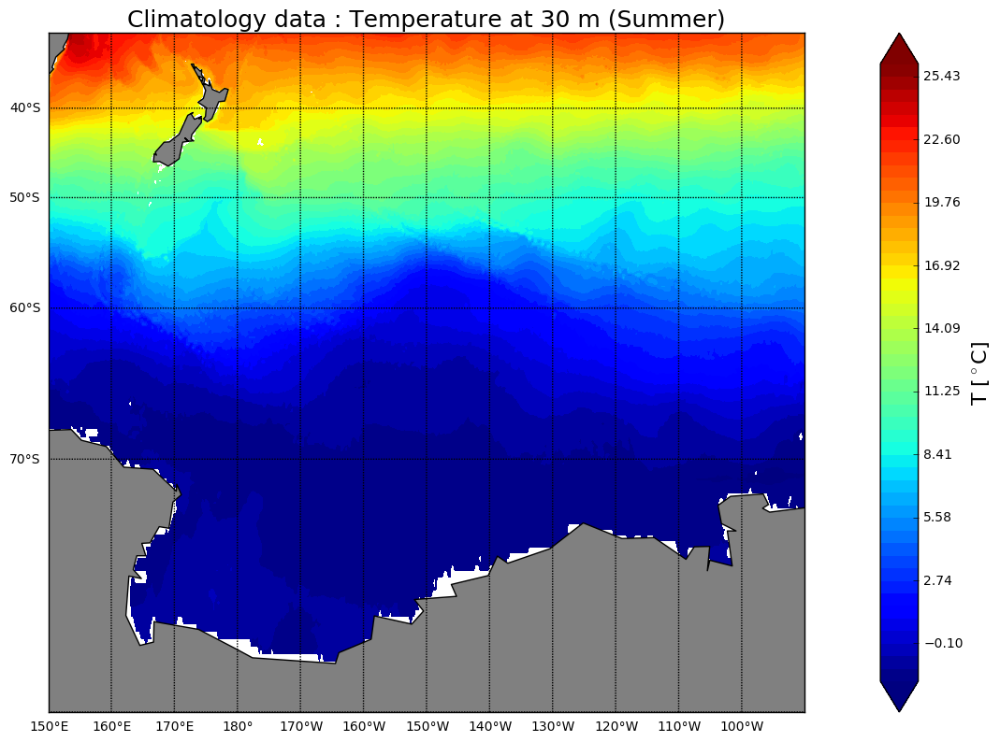

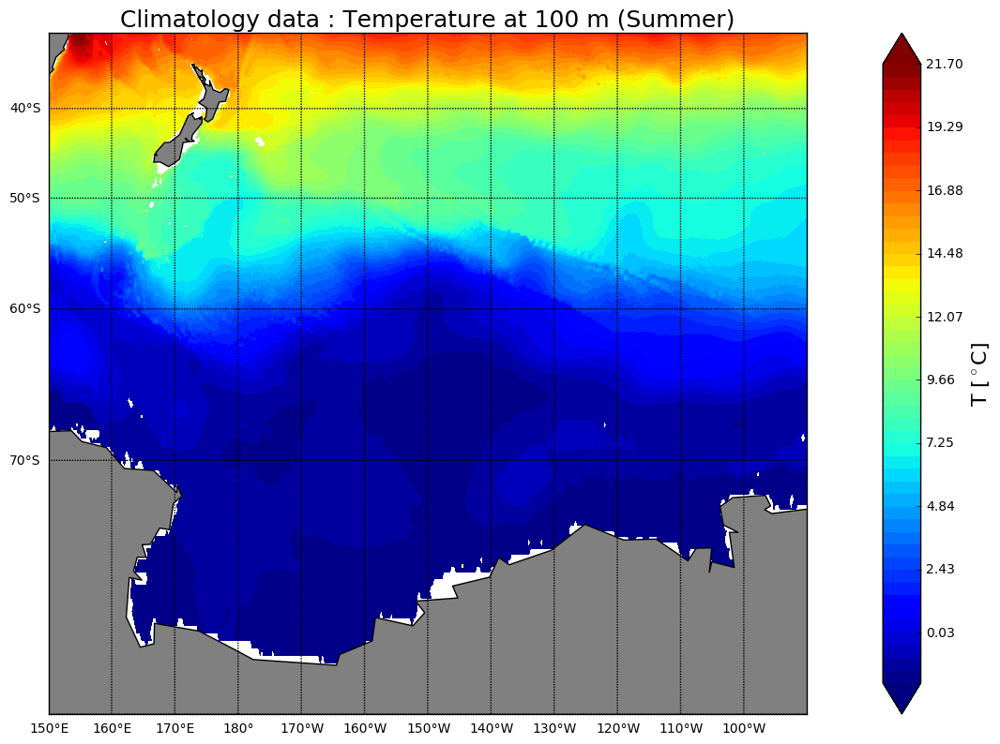

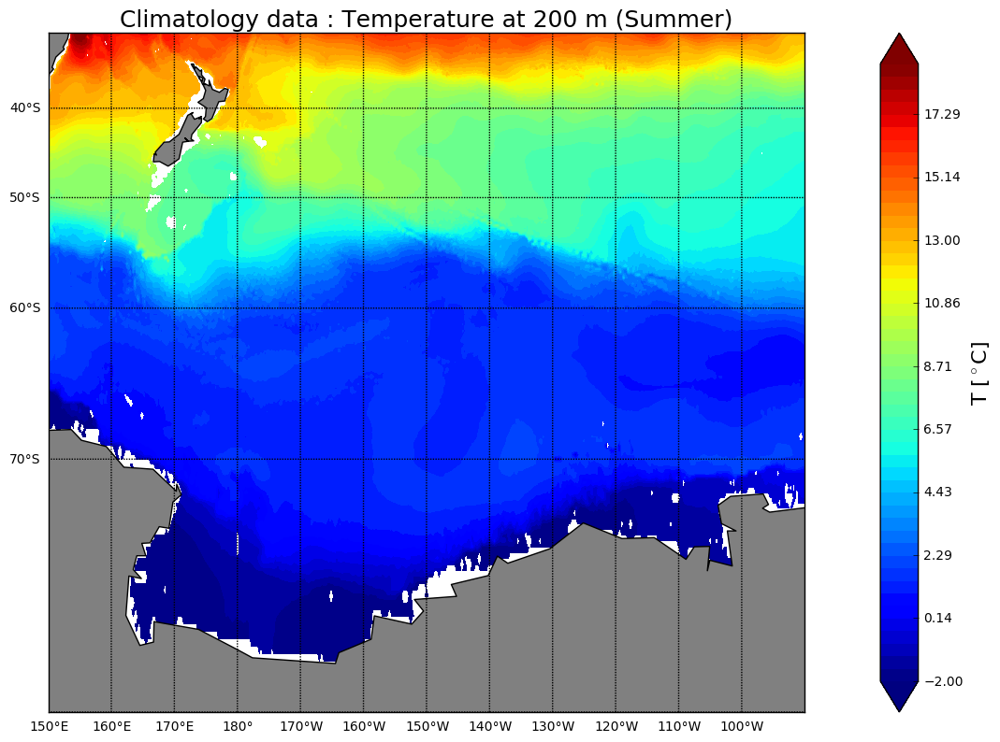

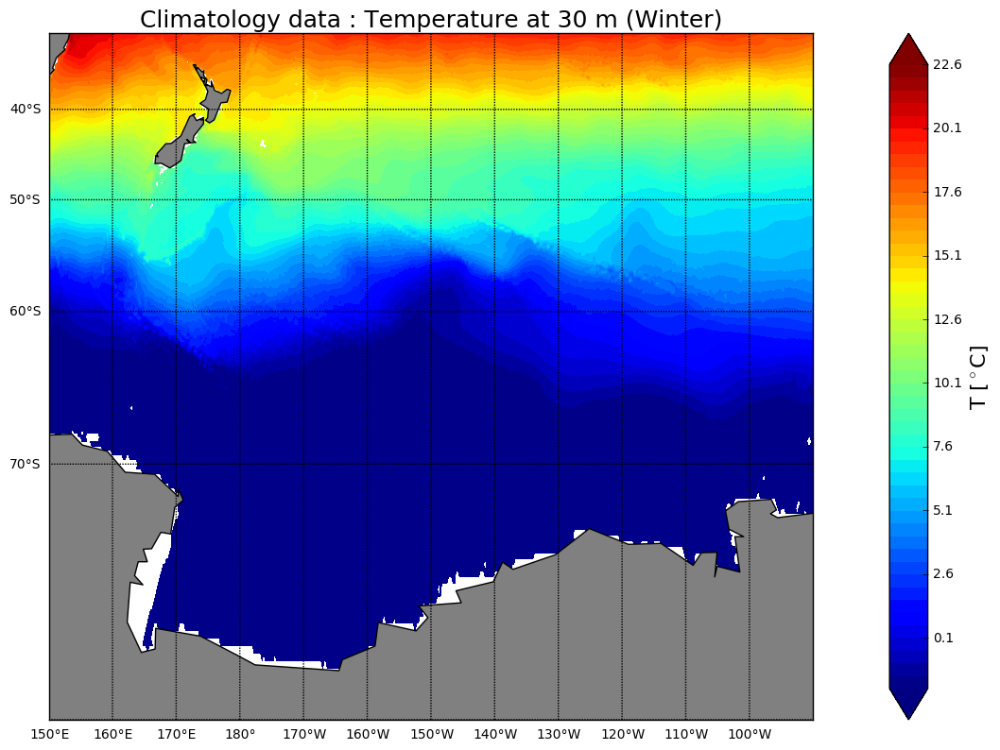

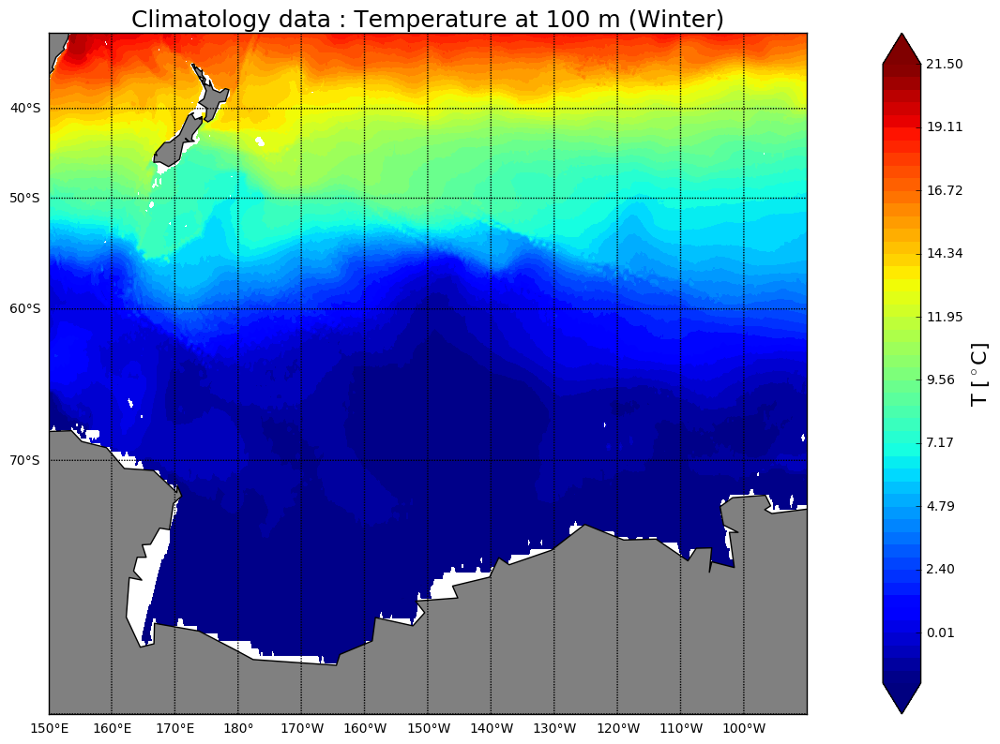

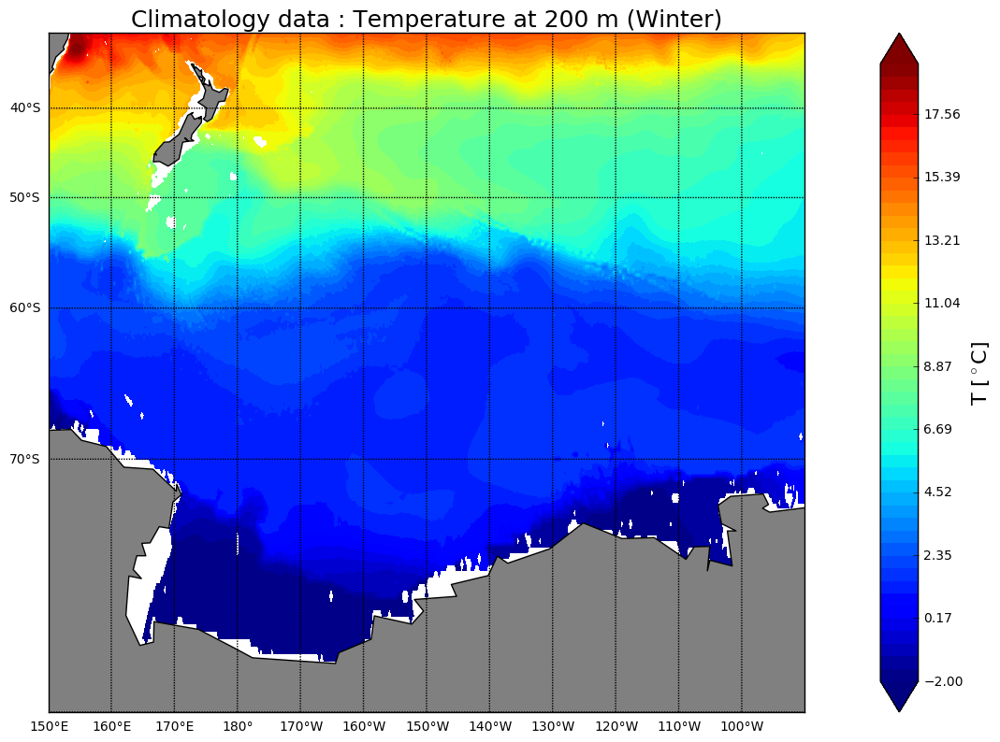

In [16]:
seasonal_mean(1, np.linspace(-1.8,26,50), 'temperature',    6, merc_map, 'Climatology data : Temperature at 30 m (Summer)', 'T [$^\circ$C]', plt.cm.jet, plot_path,  'Summer_merc_T_30.png')
seasonal_mean(1, np.linspace(-1.9,21.7,50), 'temperature', 12, merc_map, 'Climatology data : Temperature at 100 m (Summer)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Summer_merc_T_100.png')
seasonal_mean(1, np.linspace(-2,19,50), 'temperature',     16, merc_map, 'Climatology data : Temperature at 200 m (Summer)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Summer_merc_T_200.png')

seasonal_mean(0, np.linspace(-1.9,22.6,50), 'temperature',  6, merc_map, 'Climatology data : Temperature at 30 m (Winter)', 'T [$^\circ$C]', plt.cm.jet, plot_path,  'Winter_merc_T_30.png')
seasonal_mean(0, np.linspace(-1.9,21.5,50), 'temperature', 12, merc_map, 'Climatology data : Temperature at 100 m (Winter)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Winter_merc_T_100.png')
seasonal_mean(0, np.linspace(-2,19.3,50), 'temperature',   16, merc_map, 'Climatology data : Temperature at 200 m (Winter)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Winter_merc_T_200.png')

## Lambert

('Temperature min, max, mean :', -1.8635667562484741, 25.93836784362793, 7.953150669861381)
('Temperature min, max, mean :', -1.9554333686828613, 21.679466247558594, 5.978521426239833)
('Temperature min, max, mean :', -2.055633306503296, 18.96219825744629, 5.674238547291044)
('Temperature min, max, mean :', -1.9029000997543335, 22.518333435058594, 6.157900216422855)
('Temperature min, max, mean :', -1.9548667669296265, 21.44966697692871, 6.052563006653144)
('Temperature min, max, mean :', -2.050666570663452, 19.226167678833008, 5.778182370149439)


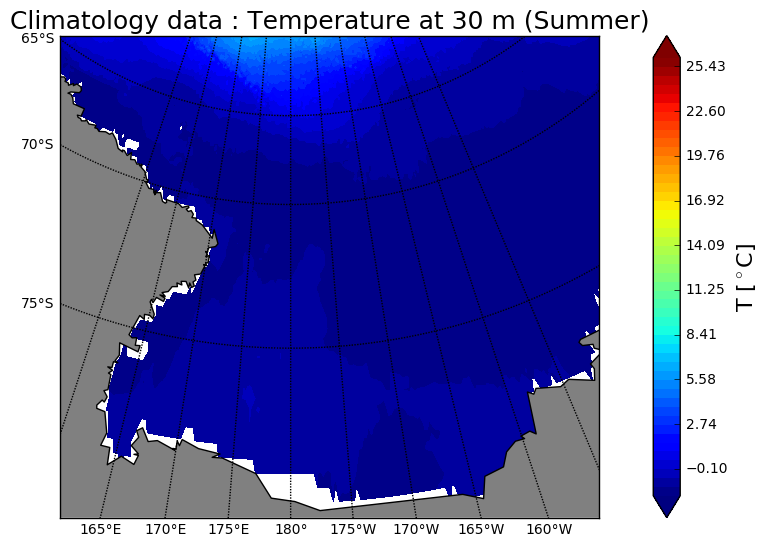

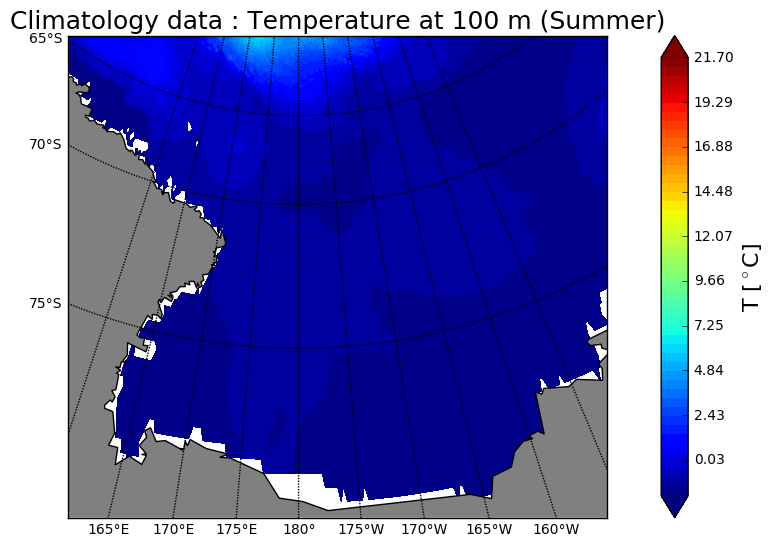

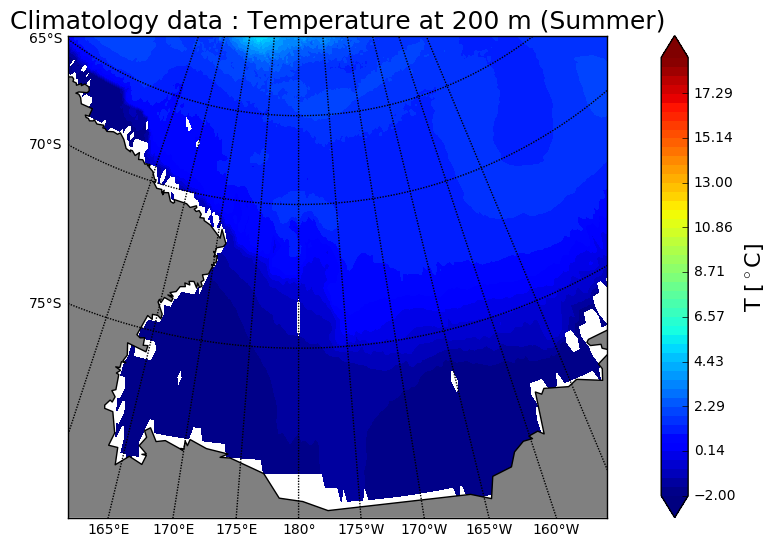

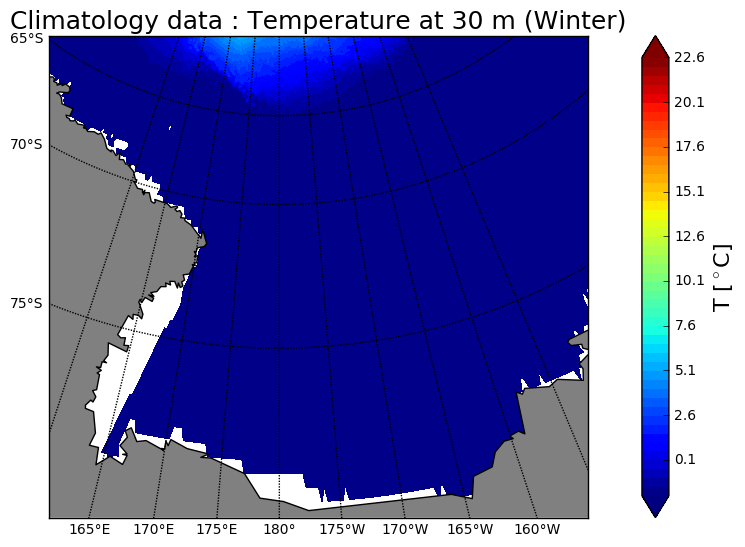

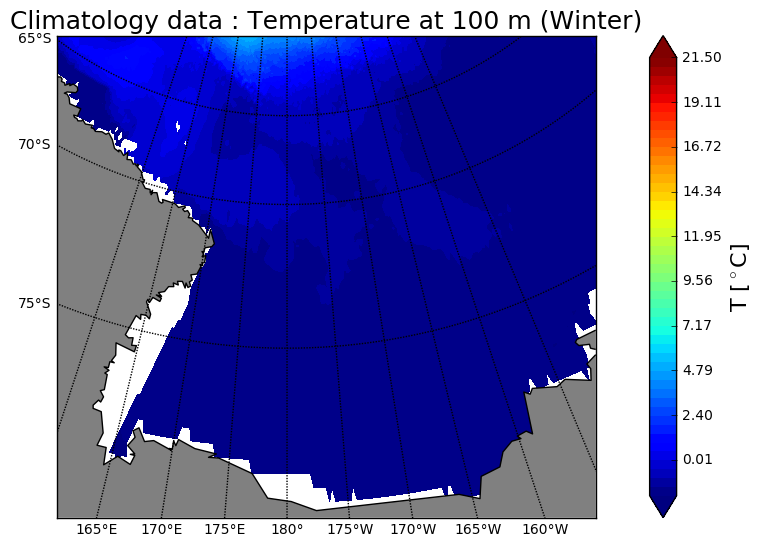

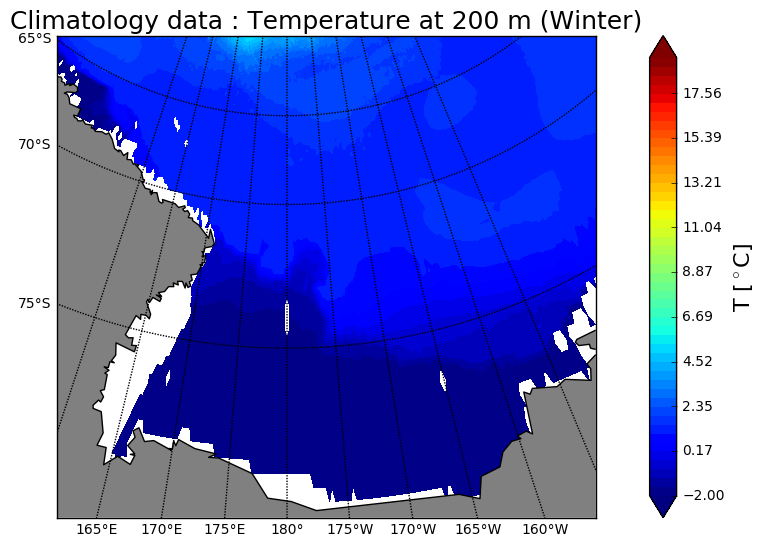

In [17]:
seasonal_mean(1, np.linspace(-1.8,26,50), 'temperature',    6, lambert_map, 'Climatology data : Temperature at 30 m (Summer)', 'T [$^\circ$C]', plt.cm.jet, plot_path,  'Summer_lamb_T_30.png')
seasonal_mean(1, np.linspace(-1.9,21.7,50), 'temperature', 12, lambert_map, 'Climatology data : Temperature at 100 m (Summer)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Summer_lamb_T_100.png')
seasonal_mean(1, np.linspace(-2,19,50), 'temperature',     16, lambert_map, 'Climatology data : Temperature at 200 m (Summer)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Summer_lamb_T_200.png')

seasonal_mean(0, np.linspace(-1.9,22.6,50), 'temperature',  6, lambert_map, 'Climatology data : Temperature at 30 m (Winter)', 'T [$^\circ$C]', plt.cm.jet, plot_path,  'Winter_lamb_T_30.png')
seasonal_mean(0, np.linspace(-1.9,21.5,50), 'temperature', 12, lambert_map, 'Climatology data : Temperature at 100 m (Winter)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Winter_lamb_T_100.png')
seasonal_mean(0, np.linspace(-2,19.3,50), 'temperature',   16, lambert_map, 'Climatology data : Temperature at 200 m (Winter)', 'T [$^\circ$C]', plt.cm.jet, plot_path, 'Winter_lamb_T_200.png')

***

# Differences (climatology - model)

## Mercator

('loaded from : ', '/data/ebent/mean_Theta_surf_2.npy')
('Diff min, max, mean :', -8.660283579111024, 24.553390502929688, 0.0031651430444310895)
('loaded from : ', '/data/ebent/mean_Theta_30_2.npy')
('Diff min, max, mean :', -8.844939134413146, 24.239290237426758, -0.007912836921308722)
('loaded from : ', '/data/ebent/mean_Theta_100_2.npy')
('Diff min, max, mean :', -9.920922044601639, 21.24574851989746, -0.2330121551460851)
('loaded from : ', '/data/ebent/mean_Theta_200_2.npy')
('Diff min, max, mean :', -9.770749791114856, 18.124242782592773, -0.25317633850314447)
('loaded from : ', '/data/ebent/mean_Theta_500_2.npy')
('Diff min, max, mean :', -7.221745961913474, 13.894824981689453, -0.1490554717810941)


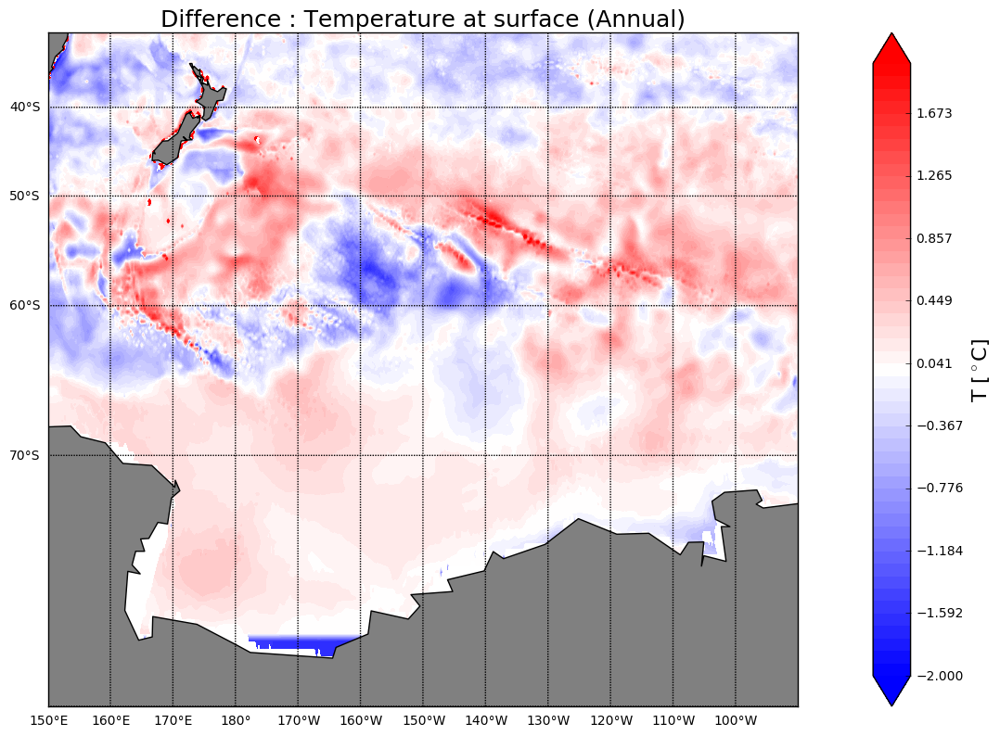

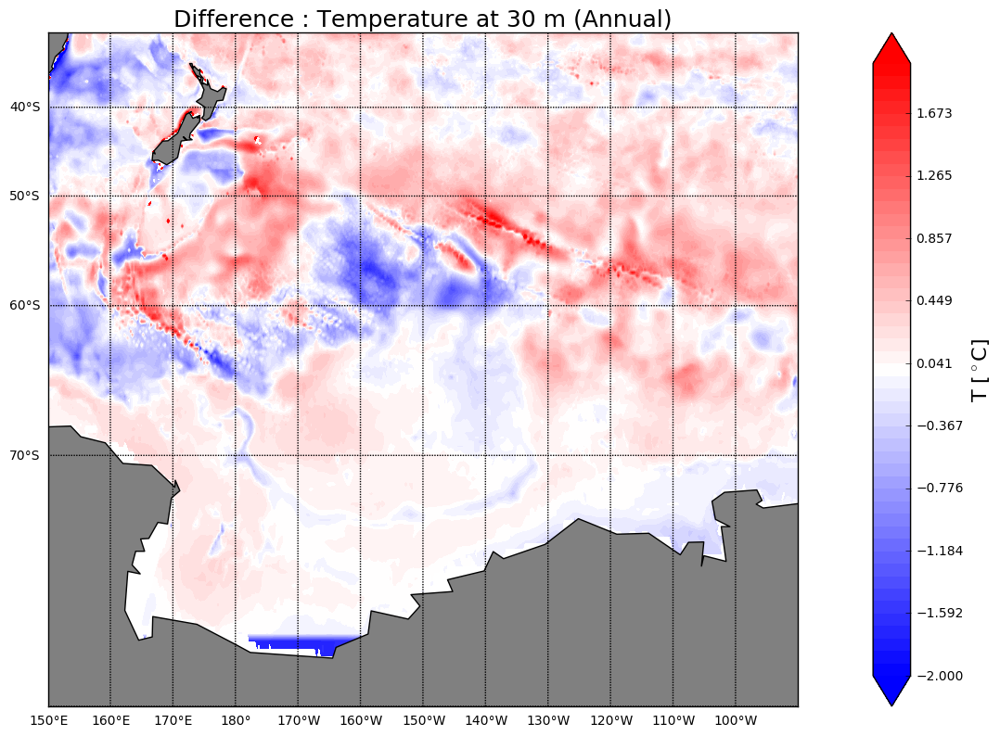

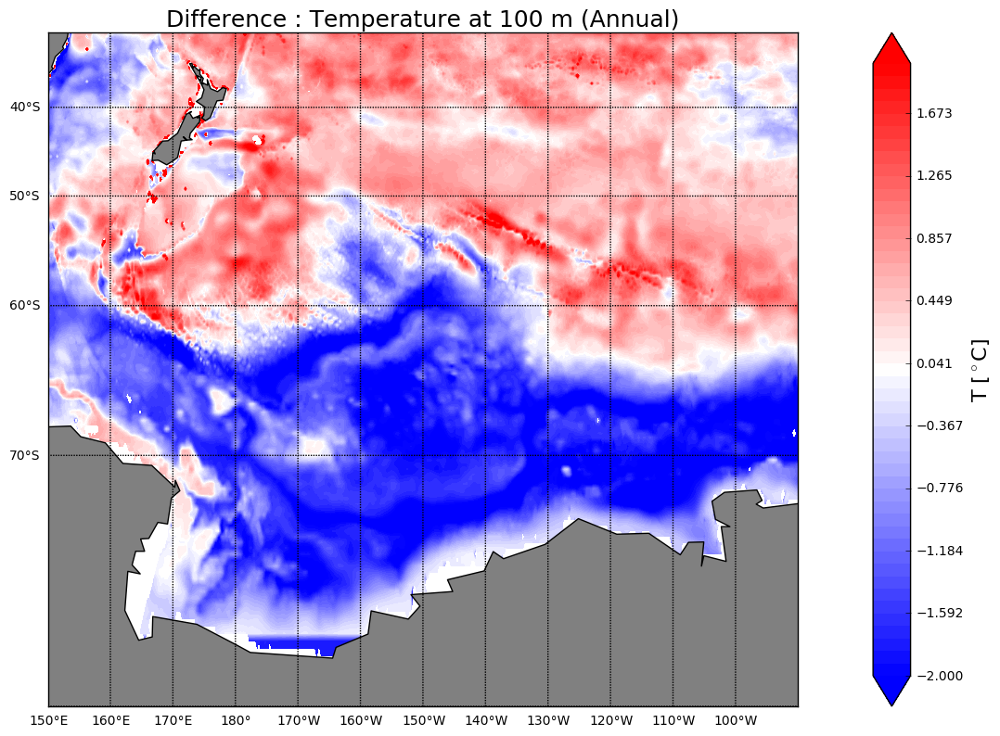

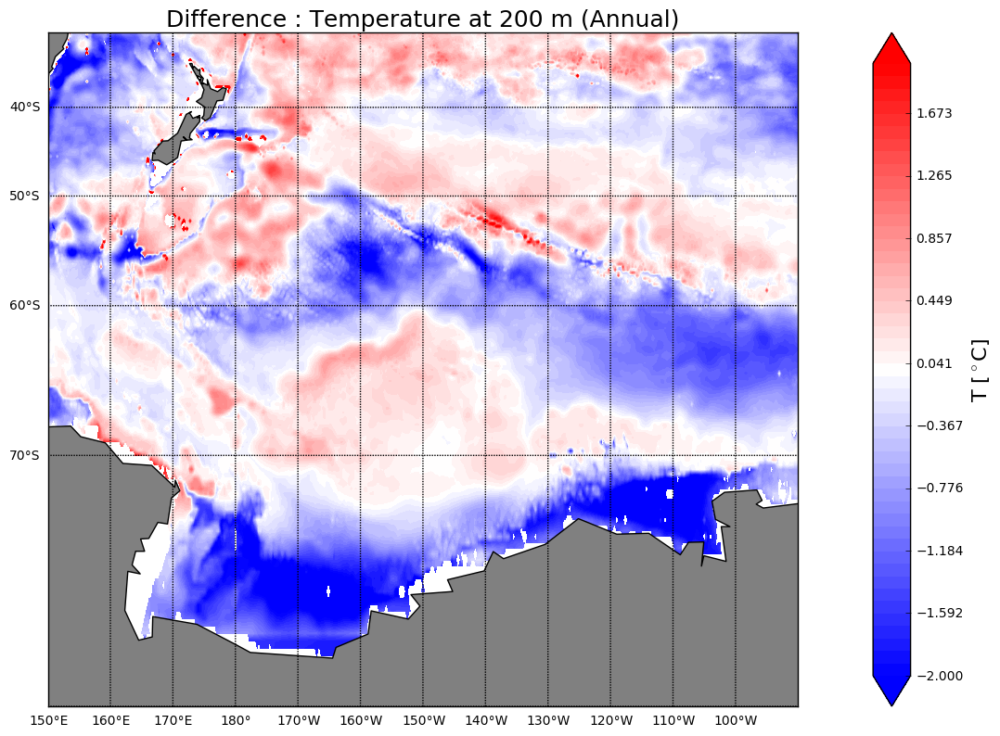

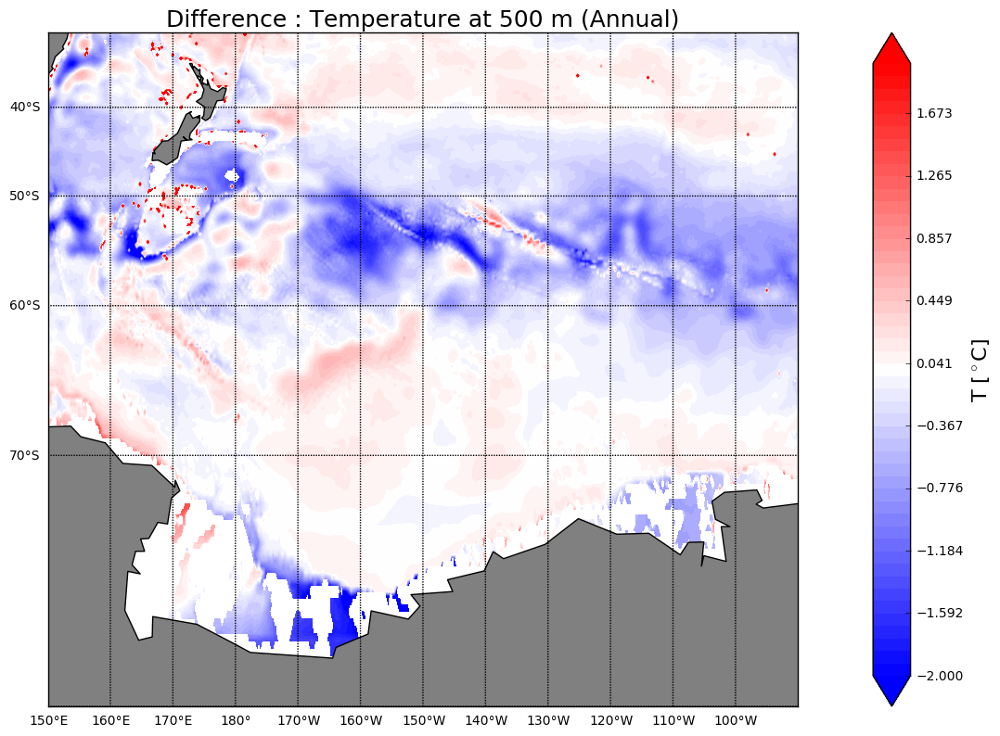

In [18]:
annual_diff(1, np.linspace(-2,2,50), 'temperature', 0, 'mean_Theta_surf_2', 'Difference : Temperature at surface (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Annual_merc_T_surf.png')
annual_diff(1, np.linspace(-2,2,50), 'temperature', 6,   'mean_Theta_30_2', 'Difference : Temperature at 30 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,    'Diff_Annual_merc_T_30.png')
annual_diff(1, np.linspace(-2,2,50), 'temperature', 12, 'mean_Theta_100_2', 'Difference : Temperature at 100 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,   'Diff_Annual_merc_T_100.png')
annual_diff(1, np.linspace(-2,2,50), 'temperature', 16, 'mean_Theta_200_2', 'Difference : Temperature at 200 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,   'Diff_Annual_merc_T_200.png')
annual_diff(1, np.linspace(-2,2,50), 'temperature', 22, 'mean_Theta_500_2', 'Difference : Temperature at 500 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,    'Diff_Annual_merc_T_500.png')

## Lambert

('loaded from : ', '/data/ebent/mean_Theta_surf.npy')
('Diff min, max, mean :', -1.6128000020980835, 25.237089031049997, 8.216721479488708)
('loaded from : ', '/data/ebent/mean_Theta_30.npy')
('Diff min, max, mean :', -1.7117999792099, 25.013482915762417, 8.098854489873338)
('loaded from : ', '/data/ebent/mean_Theta_100.npy')
('Diff min, max, mean :', -2.8193959995237705, 20.567751676237908, 5.510648341308921)
('loaded from : ', '/data/ebent/mean_Theta_200.npy')
('Diff min, max, mean :', -3.4515051701868797, 17.67624048497436, 4.553398218079182)
('loaded from : ', '/data/ebent/mean_Theta_500.npy')
('Diff min, max, mean :', -3.2130975607728267, 12.740670067805572, 3.400733205373175)


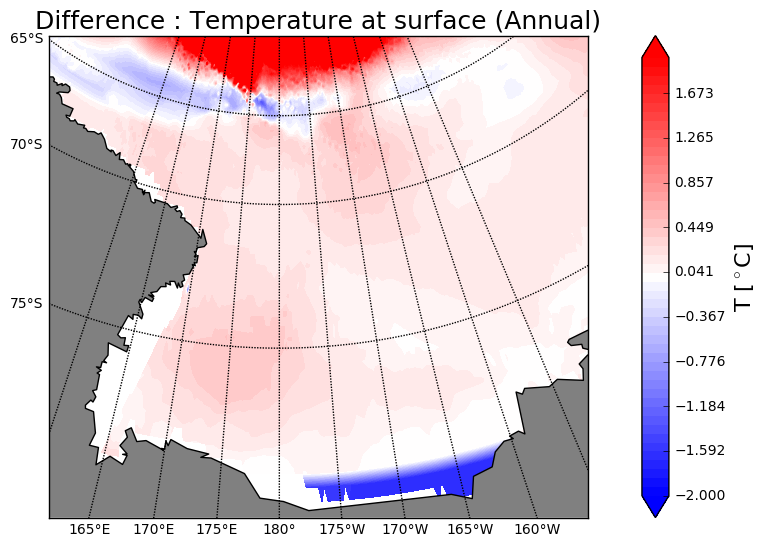

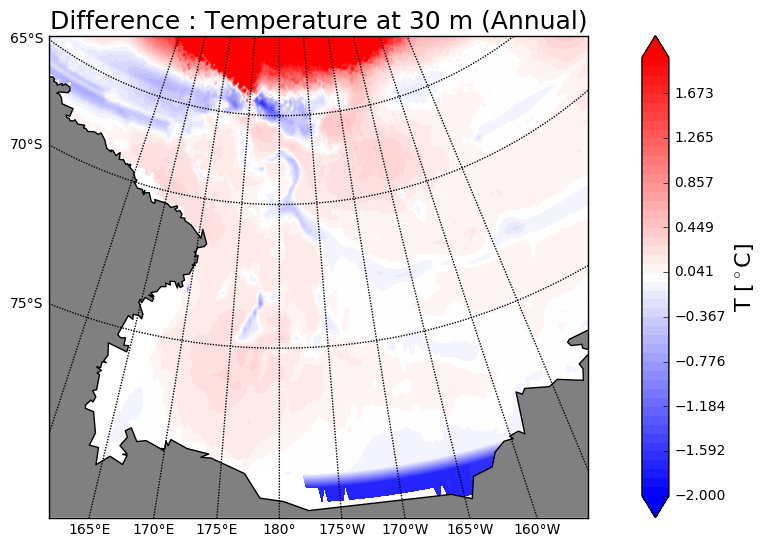

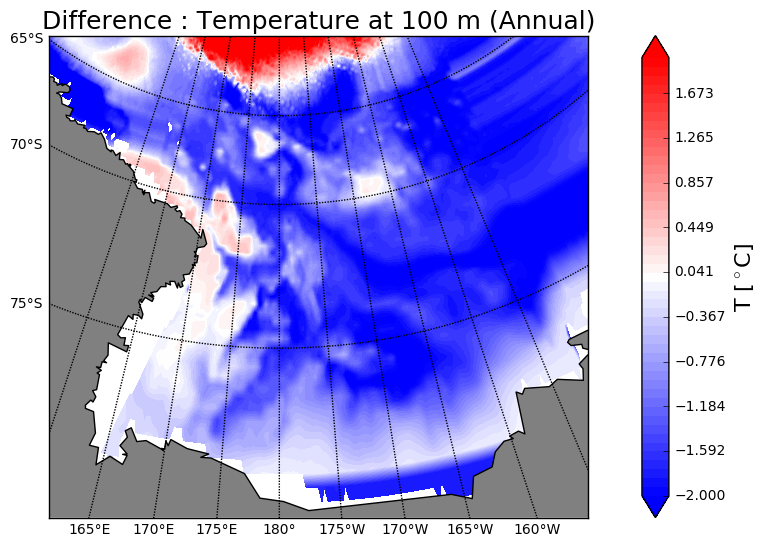

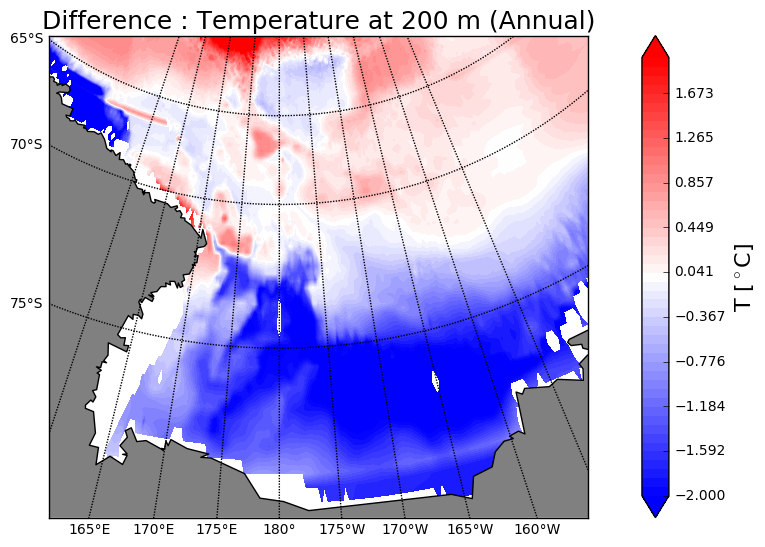

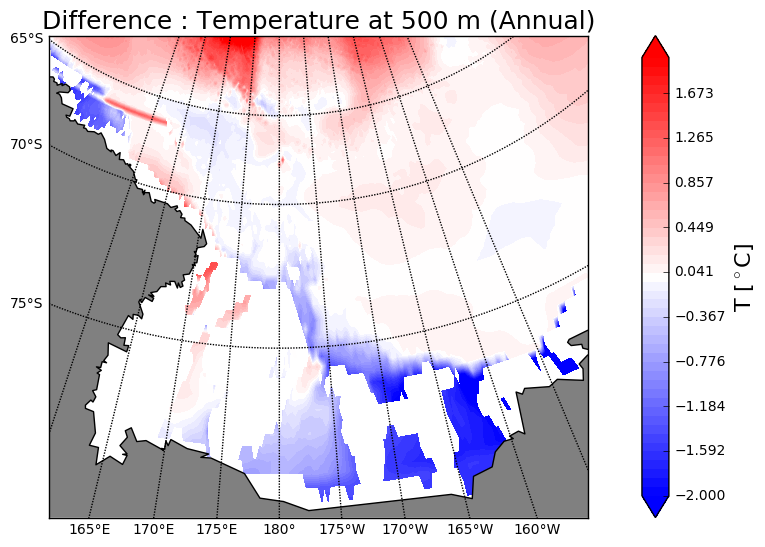

In [19]:
annual_diff(0, np.linspace(-2,2,50), 'temperature', 0, 'mean_Theta_surf', 'Difference : Temperature at surface (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Annual_lamb_T_surf.png')
annual_diff(0, np.linspace(-2,2,50), 'temperature', 6,   'mean_Theta_30', 'Difference : Temperature at 30 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,    'Diff_Annual_lamb_T_30.png')
annual_diff(0, np.linspace(-2,2,50), 'temperature', 12, 'mean_Theta_100', 'Difference : Temperature at 100 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,   'Diff_Annual_lamb_T_100.png')
annual_diff(0, np.linspace(-2,2,50), 'temperature', 16, 'mean_Theta_200', 'Difference : Temperature at 200 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,   'Diff_Annual_lamb_T_200.png')
annual_diff(0, np.linspace(-2,2,50), 'temperature', 22, 'mean_Theta_500', 'Difference : Temperature at 500 m (Annual)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,   'Diff_Annual_lamb_T_500.png')

***

# DJF and JJA compared to T1,T2,T12 and T6,T7,T8

## Mercator proj

('loaded from : ', '/data/ebent/mean_Theta_30_DJF.npy')
('Diff min, max, mean :', -8.621247125190216, 25.93836784362793, 0.21493726399433408)
('loaded from : ', '/data/ebent/mean_Theta_100_DJF.npy')
('Diff min, max, mean :', -10.51258726645328, 21.159799575805664, -0.2916916609390398)
('loaded from : ', '/data/ebent/mean_Theta_200_DJF.npy')
('Diff min, max, mean :', -10.323917773732557, 18.15093421936035, -0.2924098050763705)
('loaded from : ', '/data/ebent/mean_Theta_30_JJA.npy')
('Diff min, max, mean :', -8.889806184821376, 22.518333435058594, 0.14178783326968486)
('loaded from : ', '/data/ebent/mean_Theta_100_JJA.npy')
('Diff min, max, mean :', -9.24954388092001, 21.44966697692871, -0.1731014409191884)
('loaded from : ', '/data/ebent/mean_Theta_200_JJA.npy')
('Diff min, max, mean :', -9.74866934731375, 18.229734420776367, -0.20523296071130434)


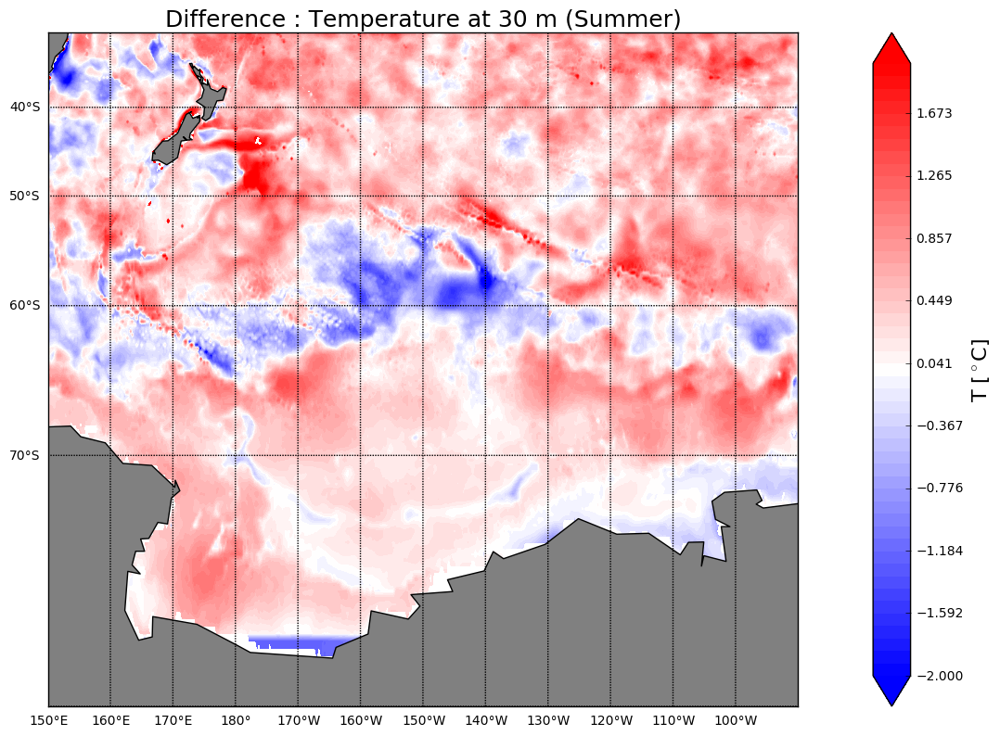

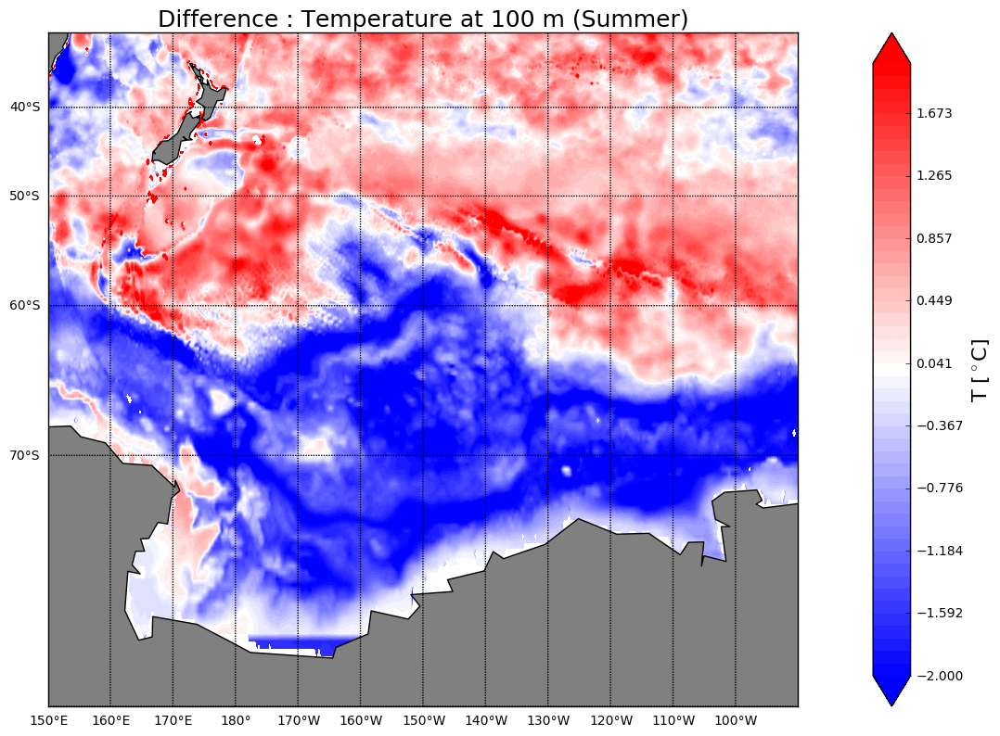

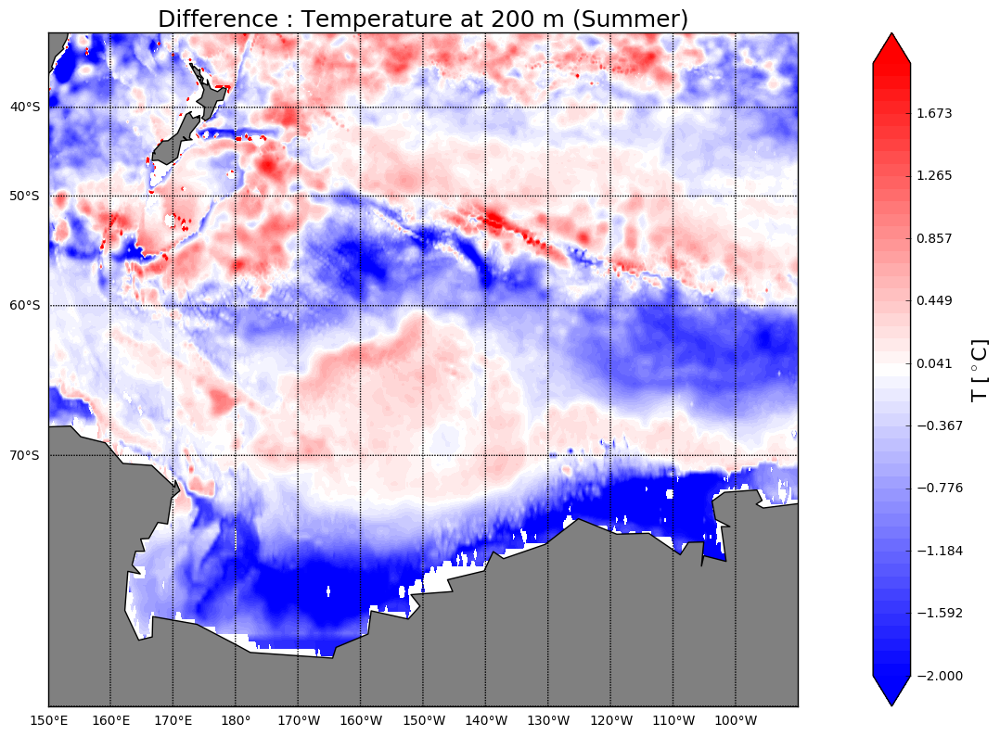

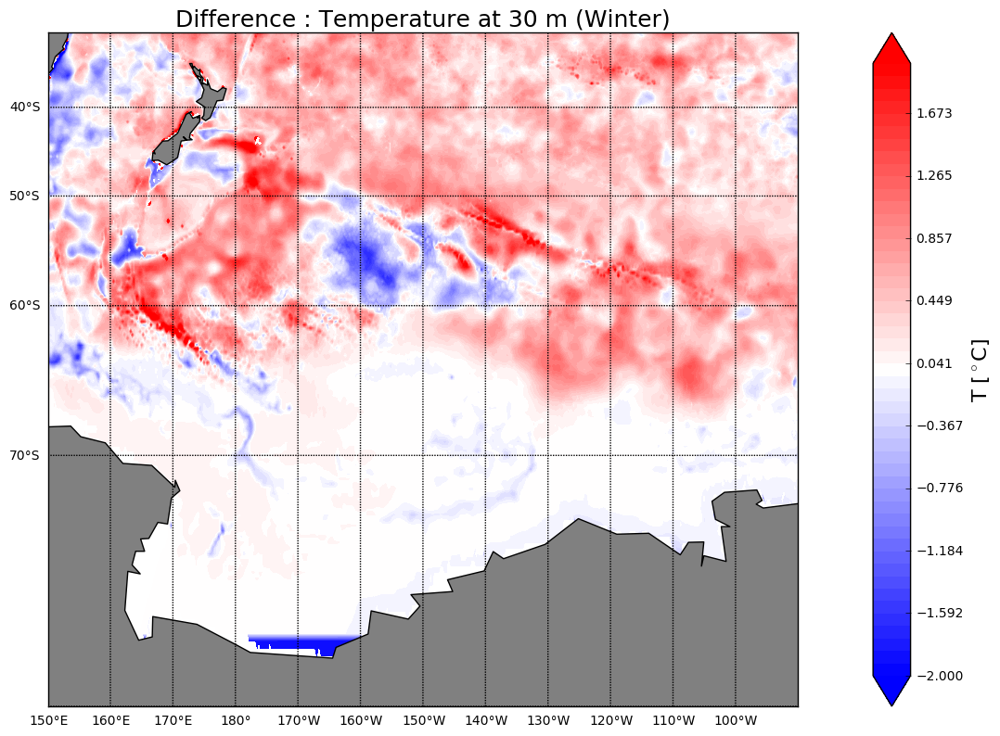

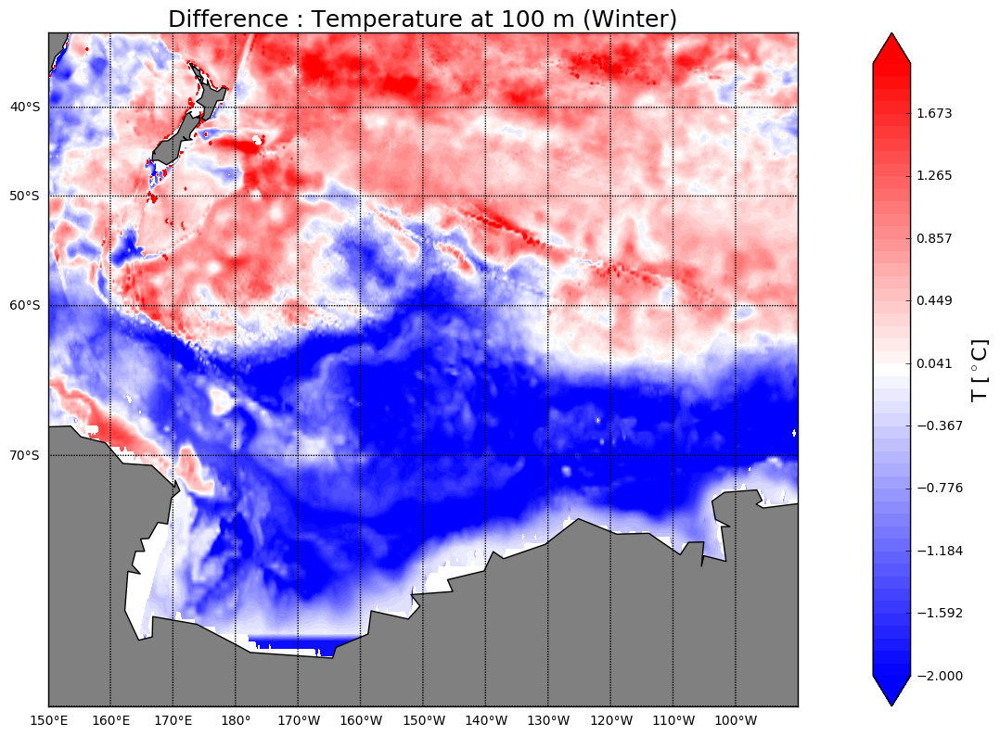

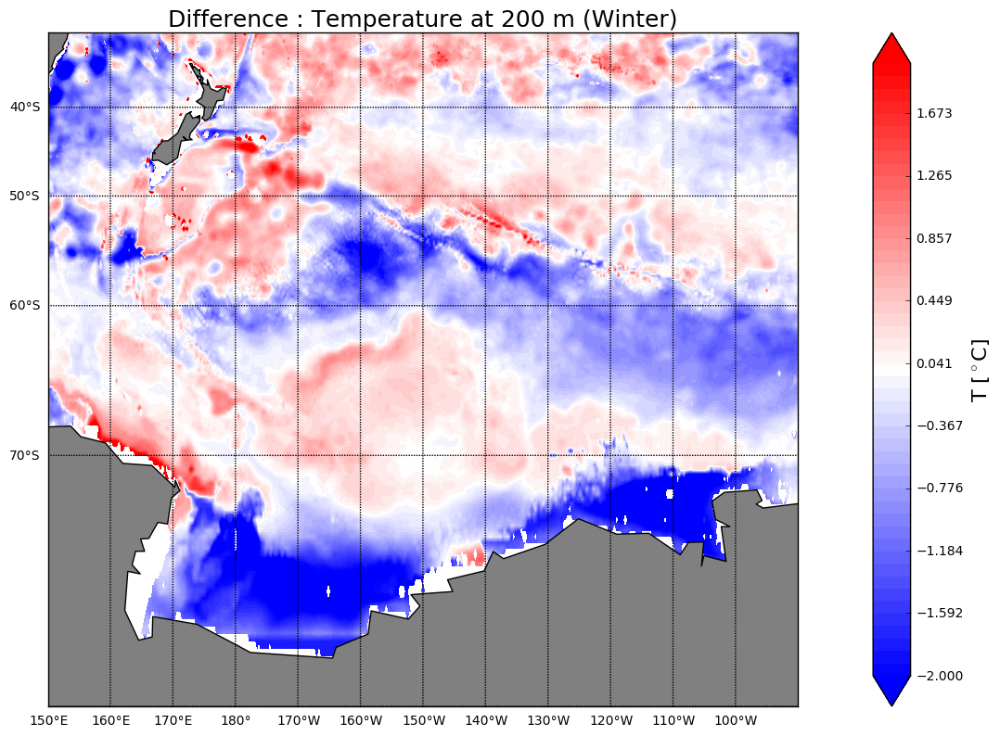

In [20]:
seasonal_diff(1, 1, np.linspace(-2,2,50), 'temperature', 6,   'mean_Theta_30_DJF', 'Difference : Temperature at 30 m (Summer)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,  'Diff_Summer_merc_T_30.png')
seasonal_diff(1, 1, np.linspace(-2,2,50), 'temperature', 12, 'mean_Theta_100_DJF', 'Difference : Temperature at 100 m (Summer)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Summer_merc_T_100.png')
seasonal_diff(1, 1, np.linspace(-2,2,50), 'temperature', 16, 'mean_Theta_200_DJF', 'Difference : Temperature at 200 m (Summer)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Summer_merc_T_200.png')

seasonal_diff(0, 1, np.linspace(-2,2,50), 'temperature', 6,   'mean_Theta_30_JJA', 'Difference : Temperature at 30 m (Winter)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,  'Diff_Winter_merc_T_30.png')
seasonal_diff(0, 1, np.linspace(-2,2,50), 'temperature', 12, 'mean_Theta_100_JJA', 'Difference : Temperature at 100 m (Winter)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Winter_merc_T_100.png')
seasonal_diff(0, 1, np.linspace(-2,2,50), 'temperature', 16, 'mean_Theta_200_JJA', 'Difference : Temperature at 200 m (Winter)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Winter_merc_T_200.png')

## Lambert

In [ ]:
seasonal_diff(1, 0, np.linspace(-2,2,50), 'temperature', 6, 'mean_Theta_30_DJF',   'Difference : Temperature at 30 m (Summer)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,  'Diff_Summer_lamb_T_30.png')
seasonal_diff(1, 0, np.linspace(-2,2,50), 'temperature', 12, 'mean_Theta_100_DJF', 'Difference : Temperature at 100 m (Summer)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Summer_lamb_T_100.png')
seasonal_diff(1, 0, np.linspace(-2,2,50), 'temperature', 16, 'mean_Theta_200_DJF', 'Difference : Temperature at 200 m (Summer)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Summer_lamb_T_200.png')

seasonal_diff(0, 0, np.linspace(-2,2,50), 'temperature', 6, 'mean_Theta_30_JJA',   'Difference : Temperature at 30 m (Winter)', 'T [$^\circ$C]', plt.cm.bwr, plot_path,  'Diff_Winter_lamb_T_30.png')
seasonal_diff(0, 0, np.linspace(-2,2,50), 'temperature', 12, 'mean_Theta_100_JJA', 'Difference : Temperature at 100 m (Winter)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Winter_lamb_T_100.png')
seasonal_diff(0, 0, np.linspace(-2,2,50), 'temperature', 16, 'mean_Theta_200_JJA', 'Difference : Temperature at 200 m (Winter)', 'T [$^\circ$C]', plt.cm.bwr, plot_path, 'Diff_Winter_lamb_T_200.png')

***

# Gradients

def grad_climatology(lat_n, lon_n):
    
    lon = lon_n*4+720
    lat = (lat_n+80)*4
    
    T1   = file1.variables['temperature'][:,:,lat,lon]
    T2   = file2.variables['temperature'][:,:,lat,lon]
    T3   = file3.variables['temperature'][:,:,lat,lon]
    T4   = file4.variables['temperature'][:,:,lat,lon]
    T5   = file5.variables['temperature'][:,:,lat,lon]
    T6   = file6.variables['temperature'][:,:,lat,lon]
    T7   = file7.variables['temperature'][:,:,lat,lon]
    T8   = file8.variables['temperature'][:,:,lat,lon]
    T9   = file9.variables['temperature'][:,:,lat,lon]
    T10 = file10.variables['temperature'][:,:,lat,lon]
    T11 = file11.variables['temperature'][:,:,lat,lon]
    T12 = file12.variables['temperature'][:,:,lat,lon]
    
    T1 = np.squeeze(T1)
    T2 = np.squeeze(T2)
    T3 = np.squeeze(T3)
    T4 = np.squeeze(T4)
    T5 = np.squeeze(T5)
    T6 = np.squeeze(T6)
    T7 = np.squeeze(T7)
    T8 = np.squeeze(T8)
    T9 = np.squeeze(T9)
    T10 = np.squeeze(T10)
    T11 = np.squeeze(T11)
    T12 = np.squeeze(T12)
    
    T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12
    
    fig = plt.figure(figsize=(8,4), dpi=300)
    plt.plot(T, depth)
    plt.title('Climatology data : Temperature profile at lat = '+ str(lat_n) + ' and lon = ' + str(lon_n))#, loc='left')
    plt.xlabel('Temperature [$^\circ$C]')
    plt.ylabel('Depth [m]')
    plt.gca().invert_yaxis() #gca : get current axis
    #plt.savefig(plot_path + 'T_150.png', bbox_inches='tight')

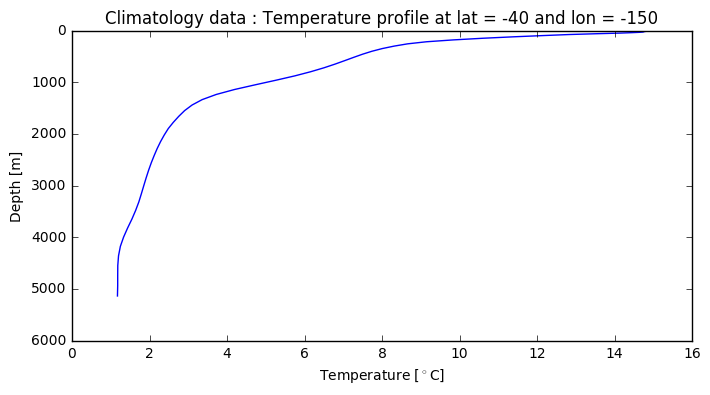

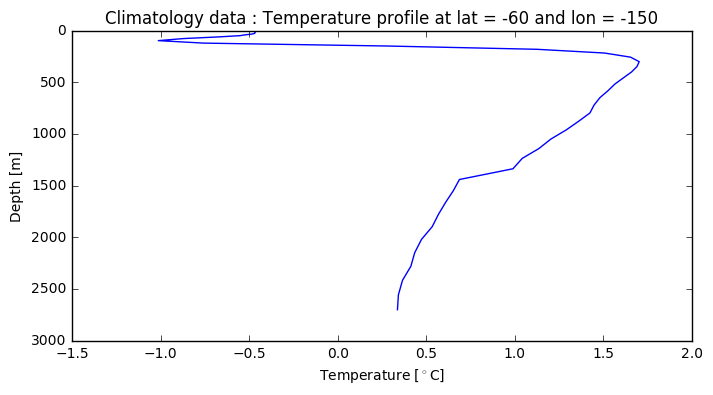

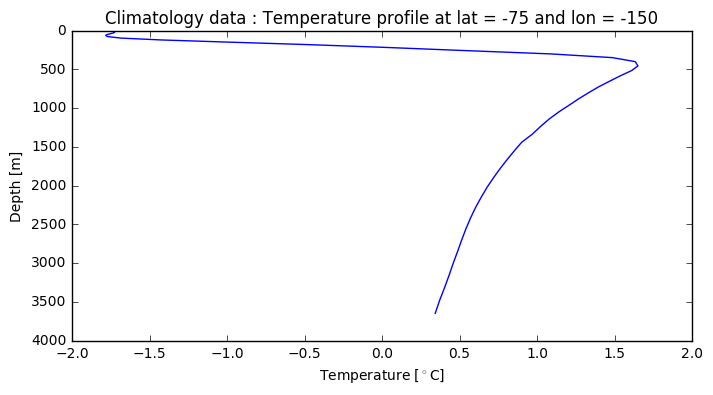

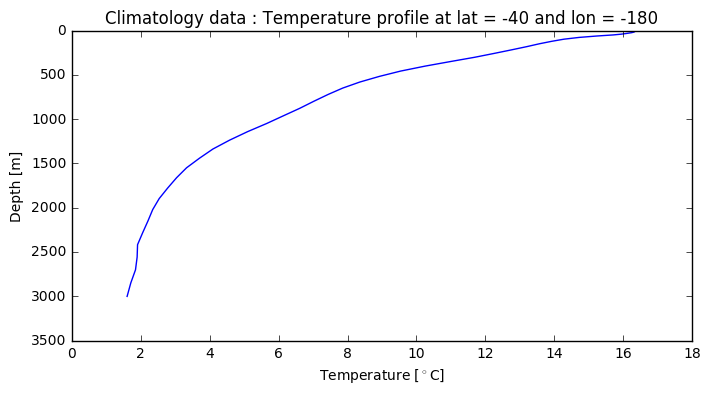

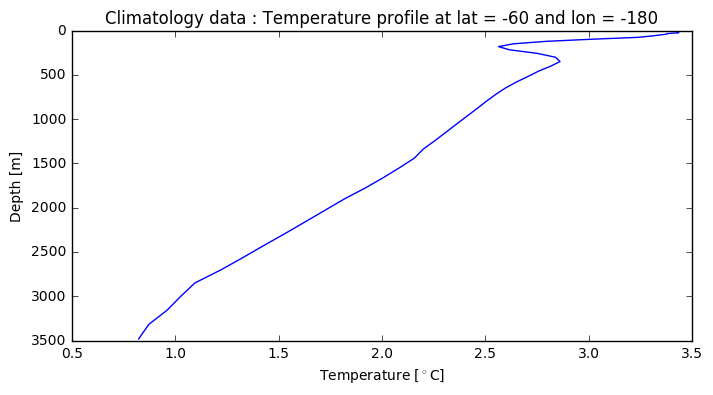

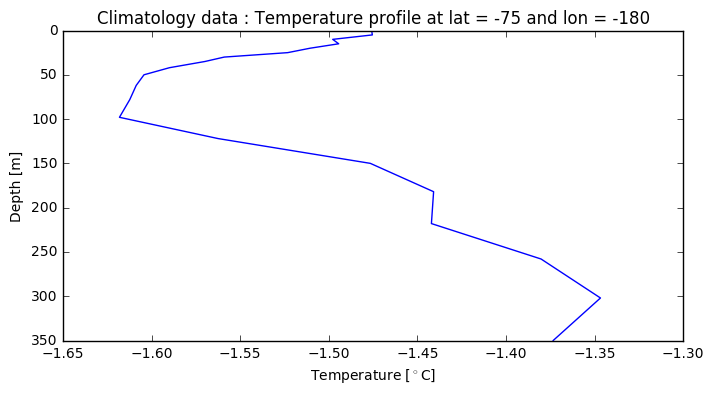

In [20]:
# 150W
grad_climatology(-40, -150)
grad_climatology(-60, -150)
grad_climatology(-75, -150)

# 180W
grad_climatology(-40, -180)
grad_climatology(-60, -180)
grad_climatology(-75, -180)

In [15]:
def grad_climatology(lat_n, lon_n, nb_subplt):
    
    lon = lon_n*4+720
    lat = (lat_n+80)*4
    
    T1   = file1.variables['temperature'][:,:,lat,lon]
    T2   = file2.variables['temperature'][:,:,lat,lon]
    T3   = file3.variables['temperature'][:,:,lat,lon]
    T4   = file4.variables['temperature'][:,:,lat,lon]
    T5   = file5.variables['temperature'][:,:,lat,lon]
    T6   = file6.variables['temperature'][:,:,lat,lon]
    T7   = file7.variables['temperature'][:,:,lat,lon]
    T8   = file8.variables['temperature'][:,:,lat,lon]
    T9   = file9.variables['temperature'][:,:,lat,lon]
    T10 = file10.variables['temperature'][:,:,lat,lon]
    T11 = file11.variables['temperature'][:,:,lat,lon]
    T12 = file12.variables['temperature'][:,:,lat,lon]
    
    T1 = np.squeeze(T1)
    T2 = np.squeeze(T2)
    T3 = np.squeeze(T3)
    T4 = np.squeeze(T4)
    T5 = np.squeeze(T5)
    T6 = np.squeeze(T6)
    T7 = np.squeeze(T7)
    T8 = np.squeeze(T8)
    T9 = np.squeeze(T9)
    T10 = np.squeeze(T10)
    T11 = np.squeeze(T11)
    T12 = np.squeeze(T12)
    
    T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12
    
    plt.subplot(6,3,nb_subplt)
    plt.plot(T, depth)
    plt.title('Climatology data : Temperature profile at lat = '+ str(lat_n) + ' and lon = ' + str(lon_n), fontsize=9)#, loc='left')
    plt.xlabel('Temperature [$^\circ$C]', fontsize=6)
    plt.ylabel('Depth [m]', fontsize=6)
    plt.gca().invert_yaxis() #gca : get current axis
    #plt.savefig(plot_path + 'T_150.png', bbox_inches='tight')

# Differences

def grad_diff(lat_n, lon_n, mean_Field, ind):
    
    lon = lon_n*4+720
    LAT = (lat_n+80)*4
    
    T1   = file1.variables['temperature'][:,:,LAT,lon]
    T2   = file2.variables['temperature'][:,:,LAT,lon]
    T3   = file3.variables['temperature'][:,:,LAT,lon]
    T4   = file4.variables['temperature'][:,:,LAT,lon]
    T5   = file5.variables['temperature'][:,:,LAT,lon]
    T6   = file6.variables['temperature'][:,:,LAT,lon]
    T7   = file7.variables['temperature'][:,:,LAT,lon]
    T8   = file8.variables['temperature'][:,:,LAT,lon]
    T9   = file9.variables['temperature'][:,:,LAT,lon]
    T10 = file10.variables['temperature'][:,:,LAT,lon]
    T11 = file11.variables['temperature'][:,:,LAT,lon]
    T12 = file12.variables['temperature'][:,:,LAT,lon]
    
    T1 = np.squeeze(T1)
    T2 = np.squeeze(T2)
    T3 = np.squeeze(T3)
    T4 = np.squeeze(T4)
    T5 = np.squeeze(T5)
    T6 = np.squeeze(T6)
    T7 = np.squeeze(T7)
    T8 = np.squeeze(T8)
    T9 = np.squeeze(T9)
    T10 = np.squeeze(T10)
    T11 = np.squeeze(T11)
    T12 = np.squeeze(T12)
    
    T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12
    
    mean_Field = pickle_load(mean_Field, '/data/ebent')
    mean_Field = mean_Field[:,ind]
    nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')
    z = nc.variables['depth'][:]
    mean_Field=mean_Field[::-1]
    z=z[::-1]
    mean_Field = interpolate.interp1d(z, mean_Field, bounds_error=False)(depth)

    
    diff = T-mean_Field
    
    fig = plt.figure(figsize=(4,6), dpi=300)
    plt.plot(diff, depth)
    plt.title('Difference : Temperature profile at lat = '+ str(lat_n) + ' and lon = ' + str(lon_n))#, loc='left')
    plt.xlabel('Temperature [$^\circ$C]')
    plt.ylabel('Depth [m]')
    plt.gca().invert_yaxis() #gca : get current axis
    #plt.savefig(plot_path + 'T_150.png', bbox_inches='tight')

('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')


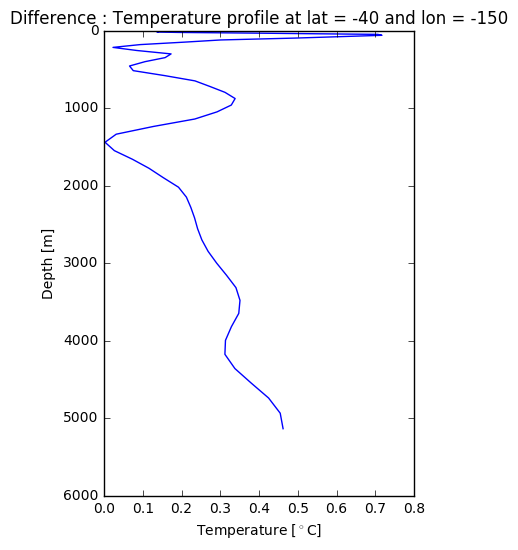

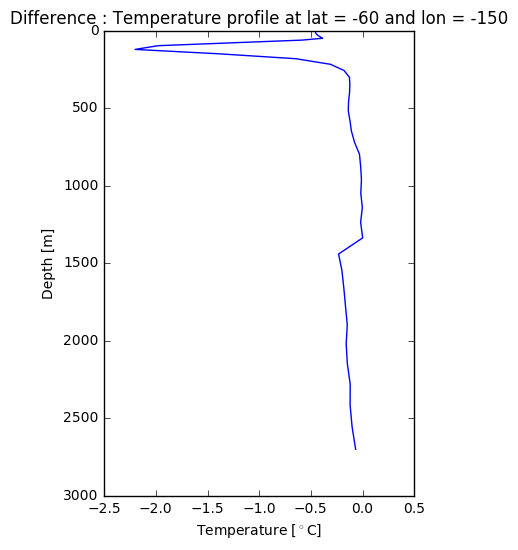

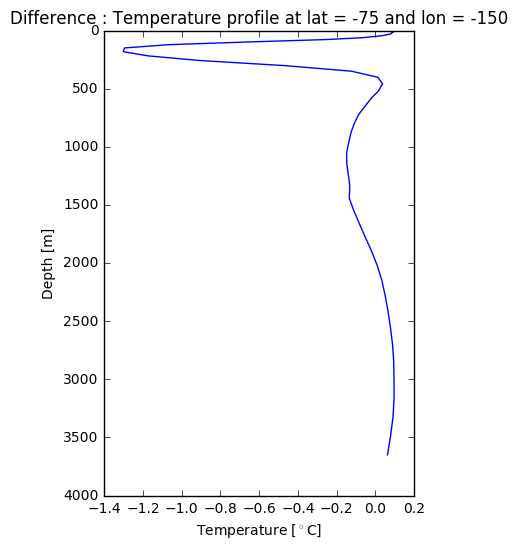

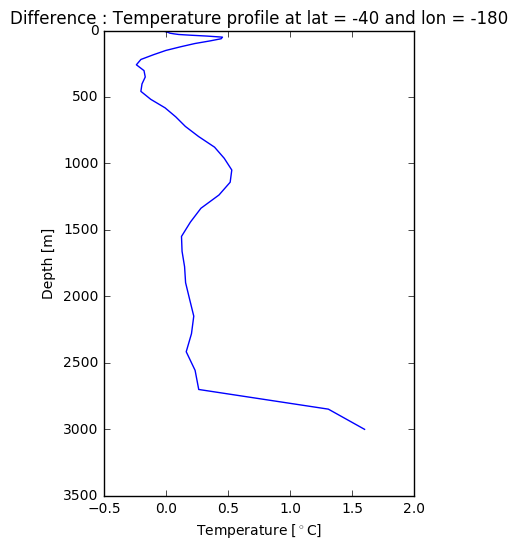

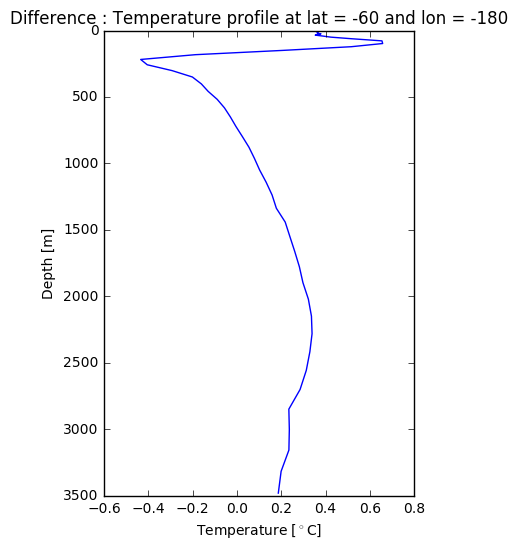

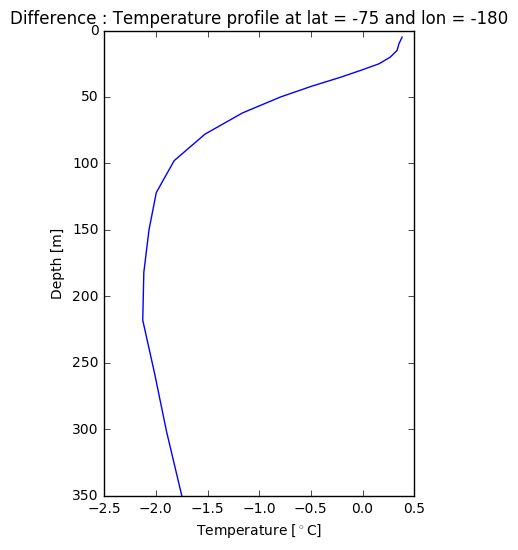

In [95]:
# 150W
grad_diff(-40, -150, 'mean_Theta_150W', 1023)
grad_diff(-60, -150, 'mean_Theta_150W', 642)
grad_diff(-75, -150, 'mean_Theta_150W', 154)

# 180W
grad_diff(-40, -180, 'mean_Theta_180W', 1023)
grad_diff(-60, -180, 'mean_Theta_180W', 642)
grad_diff(-75, -180, 'mean_Theta_180W', 154)

In [13]:
def grad_diff(lat_n, lon_n, mean_Field, ind, nb_subplt):
    
    lon = lon_n*4+720
    LAT = (lat_n+80)*4
    
    T1   = file1.variables['temperature'][:,:,LAT,lon]
    T2   = file2.variables['temperature'][:,:,LAT,lon]
    T3   = file3.variables['temperature'][:,:,LAT,lon]
    T4   = file4.variables['temperature'][:,:,LAT,lon]
    T5   = file5.variables['temperature'][:,:,LAT,lon]
    T6   = file6.variables['temperature'][:,:,LAT,lon]
    T7   = file7.variables['temperature'][:,:,LAT,lon]
    T8   = file8.variables['temperature'][:,:,LAT,lon]
    T9   = file9.variables['temperature'][:,:,LAT,lon]
    T10 = file10.variables['temperature'][:,:,LAT,lon]
    T11 = file11.variables['temperature'][:,:,LAT,lon]
    T12 = file12.variables['temperature'][:,:,LAT,lon]
    
    T1 = np.squeeze(T1)
    T2 = np.squeeze(T2)
    T3 = np.squeeze(T3)
    T4 = np.squeeze(T4)
    T5 = np.squeeze(T5)
    T6 = np.squeeze(T6)
    T7 = np.squeeze(T7)
    T8 = np.squeeze(T8)
    T9 = np.squeeze(T9)
    T10 = np.squeeze(T10)
    T11 = np.squeeze(T11)
    T12 = np.squeeze(T12)
    
    T = (T1 + T2 + T3 + T4 + T5 + T6 + T7 + T8 + T9 + T10 + T11 + T12)/12
    
    mean_Field = pickle_load(mean_Field, '/data/ebent')
    mean_Field = mean_Field[:,ind]
    minimum = mean_Field.min()
    nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')
    z = nc.variables['depth'][:]
    mean_Field=mean_Field[::-1]
    z=z[::-1]
    mean_Field = interpolate.interp1d(z, mean_Field, bounds_error=False)(depth)
    mean_Field = np.ma.masked_where(mean_Field==0., mean_Field)
    mean_Field = np.ma.masked_where(np.isnan(mean_Field), mean_Field)
    mean_Field = np.ma.masked_where(mean_Field<minimum, mean_Field)
    mean_Field = np.ma.masked_where(T.mask==True, mean_Field)
    T = np.ma.masked_where(mean_Field.mask==True, T)
    
    diff = T-mean_Field
    
    plt.subplot(6,3,nb_subplt)
    plt.plot(diff, depth)
    plt.title('Difference : Temperature profile at lat = '+ str(lat_n) + ' and lon = ' + str(lon_n), fontsize=9)#, loc='left')
    plt.xlabel('Temperature [$^\circ$C]', fontsize=6)
    plt.ylabel('Depth [m]', fontsize=6)
    plt.gca().invert_yaxis() #gca : get current axis
    #plt.savefig(plot_path + 'T_150.png', bbox_inches='tight')

In [14]:
nc = Dataset(load_path2+'so12_i0_year2006_5day_Theta.nc','r')
z = nc.variables['depth'][:]

def grad_model(mean_Field, lat, lat_title, lon_title, T_or_S, t_or_s, nb_subplt):
    
    field = pickle_load(mean_Field, '/data/ebent')
    field=field[:,lat]
    plt.subplot(6,3,nb_subplt)
    plt.plot(field, z)
    plt.title('Model : '+ str(T_or_S) + ' profile at lat = '+ str(lat_title) + ' and lon = ' + str(lon_title), fontsize=9)#, loc='left')
    plt.xlabel(str(t_or_s), fontsize=6)
    plt.ylabel('Depth [m]', fontsize=6)
    plt.gca().invert_yaxis() #gca : get current axis

('loaded from : ', '/data/ebent/mean_Theta_150W.npy')


/usr/local/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in less


('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')


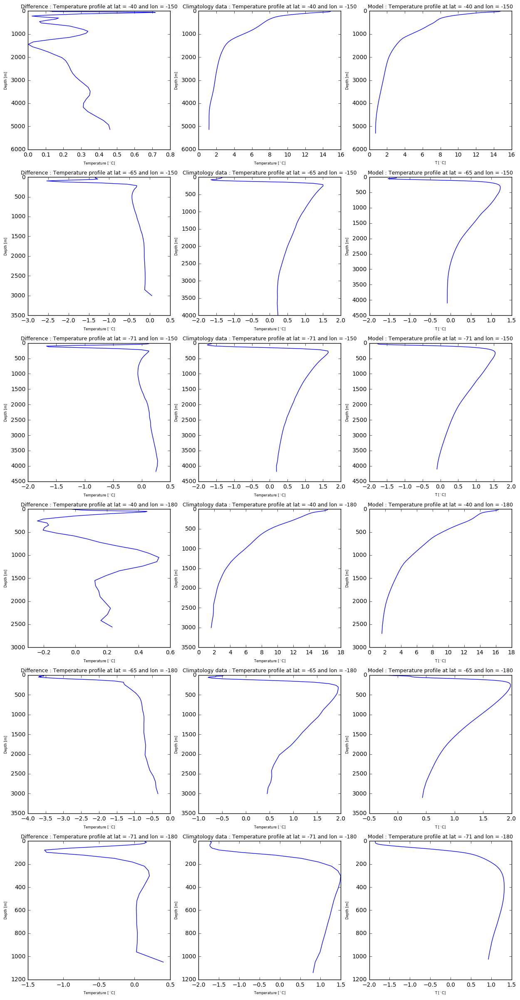

In [16]:
plt.figure(figsize=(15,30), dpi=300)

# 150W
grad_diff(-40, -150, 'mean_Theta_150W', 1023,1)
grad_diff(-65, -150, 'mean_Theta_150W', 642, 4)
grad_diff(-71, -150, 'mean_Theta_150W', 319, 7)

# 180Wlt
grad_diff(-40, -180, 'mean_Theta_180W', 1023, 10)
grad_diff(-65, -180, 'mean_Theta_180W', 642, 13)
grad_diff(-71, -180, 'mean_Theta_180W', 319, 16)

# 150W
grad_climatology(-40, -150, 2)
grad_climatology(-65, -150, 5)
grad_climatology(-71, -150, 8)

# 180W
grad_climatology(-40, -180, 11)
grad_climatology(-65, -180, 14)
grad_climatology(-71, -180, 17)

# 150W
grad_model('mean_Theta_150W', 1023, '-40', '-150', 'Temperature', 'T [$^\circ$C]', 3)
grad_model('mean_Theta_150W', 512, '-65',  '-150', 'Temperature', 'T [$^\circ$C]', 6)
grad_model('mean_Theta_150W', 319, '-71',  '-150', 'Temperature', 'T [$^\circ$C]', 9)

# 180W
grad_model('mean_Theta_180W', 1023, '-40', '-180', 'Temperature', 'T [$^\circ$C]', 12)
grad_model('mean_Theta_180W', 512, '-65', '-180', 'Temperature', 'T [$^\circ$C]', 15)
grad_model('mean_Theta_180W', 319, '-71', '-180', 'Temperature', 'T [$^\circ$C]', 18)

('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')


/usr/local/anaconda2/lib/python2.7/site-packages/ipykernel/__main__.py:44: RuntimeWarning: invalid value encountered in less


('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_150W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')
('loaded from : ', '/data/ebent/mean_Theta_180W.npy')


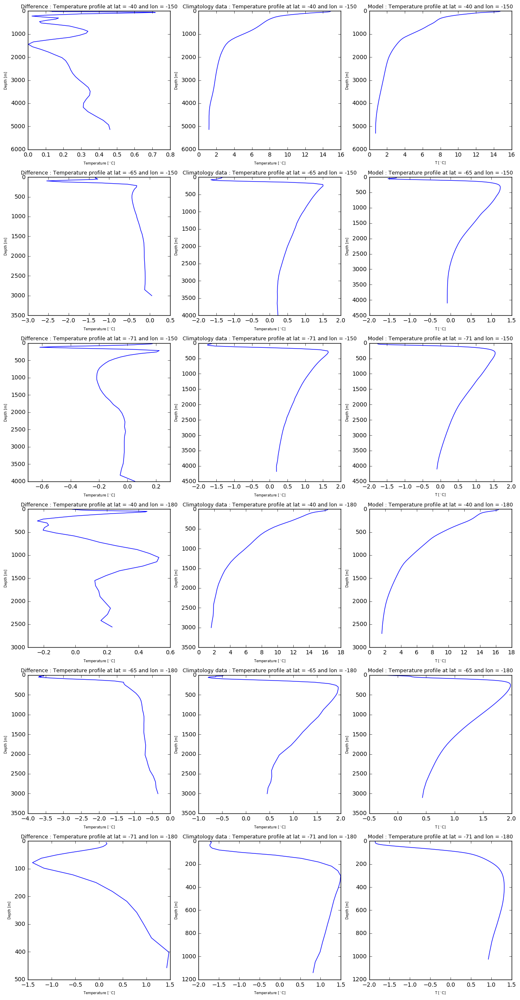

In [44]:
plt.figure(figsize=(15,30), dpi=300)

# 150W
grad_diff(-40, -150, 'mean_Theta_150W', 1023,1)
grad_diff(-65, -150, 'mean_Theta_150W', 642, 4)
grad_diff(-71, -150, 'mean_Theta_150W', 154, 7)

# 180Wlt
grad_diff(-40, -180, 'mean_Theta_180W', 1023, 10)
grad_diff(-65, -180, 'mean_Theta_180W', 642, 13)
grad_diff(-71, -180, 'mean_Theta_180W', 154, 16)

# 150W
grad_climatology(-40, -150, 2)
grad_climatology(-65, -150, 5)
grad_climatology(-71, -150, 8)

# 180W
grad_climatology(-40, -180, 11)
grad_climatology(-65, -180, 14)
grad_climatology(-71, -180, 17)

# 150W
grad_model('mean_Theta_150W', 1023, '-40', '-150', 'Temperature', 'T [$^\circ$C]', 3)
grad_model('mean_Theta_150W', 512, '-65',  '-150', 'Temperature', 'T [$^\circ$C]', 6)
grad_model('mean_Theta_150W', 319, '-71',  '-150', 'Temperature', 'T [$^\circ$C]', 9)

# 180W
grad_model('mean_Theta_180W', 1023, '-40', '-180', 'Temperature', 'T [$^\circ$C]', 12)
grad_model('mean_Theta_180W', 512, '-65', '-180', 'Temperature', 'T [$^\circ$C]', 15)
grad_model('mean_Theta_180W', 319, '-71', '-180', 'Temperature', 'T [$^\circ$C]', 18)